# Testing different ML models to predict gene set scores from surface protein data

In this notebook different reggressors (RandomForestRegressor, GradientBoostingReggressor, CatBoostRegressor) are tested to predict gene set scores from CLR tranformed surface protein data. 

5 common clusters were found in Melsen and Yang (+Crinier) datasets; 

1. Proliferating NK cells
2. CD56dim GZMK-
3. CD56dim GZMK+ (transitional subset between CD56bright and CD56dim NK cells)
4. CD56bright
5. lymhoid tissue-resident NK cells (lt-NK)

Here, gene set for lt-NK cells is explored. 


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import anndata as ad
import scvi
import scanpy as sc
import seaborn as sb


from sklearn.model_selection import train_test_split 
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score



Global seed set to 0
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [105]:
#markers

#Proliferating
prolif = ['S100A4', 'S100A6', 'KLRC2', 'IL32', 'GZMH', 'GNLY']

#CD56dim GZMK-
cd56dim_gzmk_neg= ['S100A4', 'S100A6', 'ACTB', 'ACTG1', 'CORO1A', 'PFN1', 'GZMB'] #lower expression of GZMB in gzmk_pos cluster, so marker added in this gene set

#CD56dim GZMK+
cd56dim_gzmk_pos = ['GZMK', 'SELL']

#CD56bright
cd56bright= ['NCAM1', 'KIT', 'SELL', 'CD2', 'IL7R', 'KLRC1']
#cd56bright_prot= ['CD56', 'CD62L', "CD2_prot", 'CD127']  #CD117 ab not used in this dataset

#lt-NK
lt_nk= ['CCL3', 'CCL4', 'XCL1', 'GZMK', 'CD160', 'DUSP2', 'CXCR4', 'BTG1']


In [106]:
#loading Neurips dataset
adata_neurips = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad')

In [107]:
adata_neurips

AnnData object with n_obs × n_vars = 80998 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [108]:
adata_neurips.obs['Site'].unique().tolist()

['site4', 'site3', 'site1', 'site2']

In [109]:
#selecting only sites 1 and 4 (good ab signals), from Neurips dataset

eg=adata_neurips[(adata_neurips.obs['Site'] == "site4") | (adata_neurips.obs['Site'] == "site1")].copy() 

In [110]:
eg.obs['Site'].unique().tolist()

['site4', 'site1']

In [111]:
prot=eg.obsm['protein_expression_clr_neurips']

In [112]:
prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,HLA-E,CD82,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15
GTAGTACCAATCCTTT-1-s4d1,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,0.694828,...,1.532575,0.614600,0.900688,1.389844,0.918109,0.0,0.0,0.0,0.0,0.0
CTCAAGAGTCACAGAG-1-s4d1,0.652674,1.069339,1.657770,0.890243,1.377072,1.264995,1.863027,1.101769,1.562259,1.072649,...,1.283465,0.614600,1.786480,0.762359,1.112478,0.0,0.0,0.0,0.0,0.0
CTGTGGGTCATGCGGC-1-s4d1,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,1.013739,...,1.344431,0.353792,0.860303,0.979461,1.147198,0.0,0.0,0.0,0.0,0.0
CGTGATAGTTATCTGG-1-s4d1,0.000000,1.249182,1.335424,1.256332,2.674106,1.322314,0.289336,1.240123,1.397398,1.525053,...,0.859205,1.527772,0.629556,0.854928,1.000442,0.0,0.0,0.0,0.0,0.0
AGATCCAAGATCGGTG-1-s4d1,2.784459,1.132949,1.674846,1.669058,1.663981,2.101246,2.112640,1.417276,1.884321,1.861734,...,1.429432,1.031029,2.808629,2.007436,2.064066,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTGGTTAGTCGAGTTT-1-s1d3,0.000000,0.175083,0.734526,0.000000,0.505917,1.235054,1.241451,0.512721,0.502246,1.766372,...,0.374154,0.425643,0.519947,0.484666,0.497623,0.0,0.0,0.0,0.0,0.0
GCTACAACAGTGCGCT-1-s1d3,0.378666,0.453643,0.894450,0.000000,0.766577,1.058199,1.529611,0.512721,0.663922,1.766372,...,1.074485,0.100854,1.415230,0.854928,0.560915,0.0,0.0,0.0,0.0,0.0
AACAAAGGTTGGTACT-1-s1d3,0.378666,0.324031,1.094684,0.306698,0.401377,1.983838,2.156735,0.512721,0.835018,2.400949,...,1.149104,1.324148,1.315806,0.605141,0.357584,0.0,0.0,0.0,0.0,0.0
TGACAGTCATGGCTGC-1-s1d3,0.378666,0.764571,0.776968,0.306698,0.152401,1.358780,1.753042,0.201533,0.586348,1.543085,...,1.373575,0.276377,1.113769,0.660339,0.960123,0.0,0.0,0.0,0.0,0.0


In [113]:
prot=prot.rename(columns={'CD2': 'CD2_prot', 'KLRG1': 'KLRG1_prot', 'CD83': 'CD83_prot', 'HLA-E': 'HLA-E_prot', 'CX3CR1': 'CX3CR1_prot', 'CD52': 'CD52_prot','CD69': 'CD69_prot', 'CD226':'CD226_prot', 'CD47': 'CD47_prot', 'TIGIT':'TIGIT_prot', 'CD27':'CD27_prot', 'CD38': 'CD38_prot', 'CD224': 'CD224_prot', 'CD7': 'CD7_prot', 'CD24': 'CD24_prot', 'CD163': 'CD163_prot', 'CD44': 'CD44_prot', 'CD34': 'CD34_prot','CD5': 'CD5_prot'})

In [114]:
#some proteins and genes have same names, here _prot added after protein names

a = eg.obs
b = prot

adata_eg=pd.concat([a, b], axis=1)
eg.obs=adata_eg

In [115]:
eg

AnnData object with n_obs × n_vars = 28418 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47_prot', 'CD48', 'CD40', 'CD154', 'CD52_prot', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD1

In [116]:
#selecting only NK cells, gd T cells and ILCs using Neurips annotations

eg_nk = eg[(eg.obs['cell_type'] == "NK") | (eg.obs['cell_type'] == "NK CD158e1+")].copy()   


In [117]:
eg_nk.obs['cell_type'].unique().tolist()

['NK', 'NK CD158e1+']

In [118]:
#This includes now selected cells (NK, ILC, gd T) from site 1 and 4
eg_nk

AnnData object with n_obs × n_vars = 2640 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47_prot', 'CD48', 'CD40', 'CD154', 'CD52_prot', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16

## Calculating gene scores for gene sets

In [125]:
markers = lt_nk

In [126]:
markers

['CCL3', 'CCL4', 'XCL1', 'GZMK', 'CD160', 'DUSP2', 'CXCR4', 'BTG1']

In [127]:
#calculating scores for gene set

sc.tl.score_genes(eg_nk, markers, score_name = 'marker_score')

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [128]:
eg_nk.obs['marker_score']

GTAGTACCAATCCTTT-1-s4d1    0.294028
CTGTGGGTCATGCGGC-1-s4d1   -0.052074
GCAACATTCGCAAGAG-1-s4d1   -0.479867
TCACGGGTCGCACGAC-1-s4d1   -0.502191
CGCCAGAAGACCATTC-1-s4d1   -0.067529
                             ...   
ATCATTCGTCCAATCA-1-s1d3    1.280152
ACATTTCCAGCAGTGA-1-s1d3    1.486468
TGAGACTTCCTTCAGC-1-s1d3    1.267104
GAGATGGTCCGCCTAT-1-s1d3    0.504323
ACCTGTCTCACAGTGT-1-s1d3    1.232086
Name: marker_score, Length: 2640, dtype: float64

In [129]:
prot = eg_nk.obsm['protein_expression_clr_neurips']

In [130]:
prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,HLA-E,CD82,CD101,CD88,CD224,CD197,CD34,CD10,CD90,CD15
GTAGTACCAATCCTTT-1-s4d1,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,0.694828,...,1.532575,0.614600,0.900688,1.389844,0.918109,0.0,0.0,0.0,0.0,0.0
CTGTGGGTCATGCGGC-1-s4d1,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,1.013739,...,1.344431,0.353792,0.860303,0.979461,1.147198,0.0,0.0,0.0,0.0,0.0
GCAACATTCGCAAGAG-1-s4d1,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,1.072649,...,1.218539,0.670407,0.329073,1.280509,0.676616,0.0,0.0,0.0,0.0,0.0
TCACGGGTCGCACGAC-1-s4d1,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,0.812797,...,1.456232,0.614600,0.576253,1.189870,1.000442,0.0,0.0,0.0,0.0,0.0
CGCCAGAAGACCATTC-1-s4d1,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,0.849218,...,1.556781,0.276377,0.680162,1.415407,0.729806,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,0.288523,...,1.556781,0.353792,0.519947,0.809714,0.357584,0.0,0.0,0.0,0.0,0.0
ACATTTCCAGCAGTGA-1-s1d3,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,0.652195,...,0.950948,0.555495,0.519947,0.546717,0.194691,0.0,0.0,0.0,0.0,0.0
TGAGACTTCCTTCAGC-1-s1d3,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,0.406586,...,0.374154,0.492675,0.396827,0.418509,0.000000,0.0,0.0,0.0,0.0,0.0
GAGATGGTCCGCCTAT-1-s1d3,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,0.406586,...,1.532575,0.555495,0.576253,0.546717,0.430053,0.0,0.0,0.0,0.0,0.0


In [131]:
#dropping columns containing only zeros

prot = prot.loc[:, (prot!=0).any(axis=0)]

In [132]:
prot

,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,CD52,...,CD94,CD162,CD85j,CD23,CD328,HLA-E,CD82,CD101,CD88,CD224
GTAGTACCAATCCTTT-1-s4d1,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,0.694828,...,2.475005,1.804603,1.069921,1.496785,2.696518,1.532575,0.614600,0.900688,1.389844,0.918109
CTGTGGGTCATGCGGC-1-s4d1,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,1.013739,...,1.408073,1.772872,0.890506,1.188863,2.678422,1.344431,0.353792,0.860303,0.979461,1.147198
GCAACATTCGCAAGAG-1-s4d1,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,1.072649,...,2.174035,1.013704,1.148843,1.332566,0.000000,1.218539,0.670407,0.329073,1.280509,0.676616
TCACGGGTCGCACGAC-1-s4d1,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,0.812797,...,3.016060,1.587440,1.623280,1.552023,2.164676,1.456232,0.614600,0.576253,1.189870,1.000442
CGCCAGAAGACCATTC-1-s4d1,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,0.849218,...,2.826218,2.465725,1.524077,1.637802,3.066941,1.556781,0.276377,0.680162,1.415407,0.729806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,0.288523,...,4.481286,2.345961,0.391222,0.700530,4.391692,1.556781,0.353792,0.519947,0.809714,0.357584
ACATTTCCAGCAGTGA-1-s1d3,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,0.652195,...,2.122566,1.496074,0.391222,0.410393,2.678422,0.950948,0.555495,0.519947,0.546717,0.194691
TGAGACTTCCTTCAGC-1-s1d3,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,0.406586,...,0.365443,1.296756,0.214622,0.410393,3.910620,0.374154,0.492675,0.396827,0.418509,0.000000
GAGATGGTCCGCCTAT-1-s1d3,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,0.406586,...,2.986818,1.976363,0.214622,0.990050,1.800479,1.532575,0.555495,0.576253,0.546717,0.430053


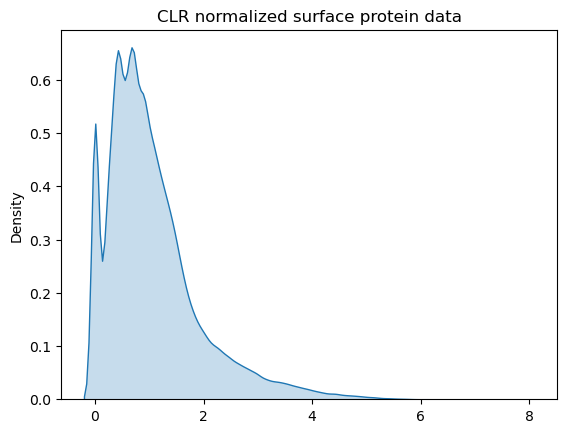

In [24]:
flatten_df = prot.to_numpy().flatten()

sb.kdeplot(flatten_df, fill = True) ; 


plt.title("CLR normalized surface protein data") ;

In [133]:
score = eg_nk.obs['marker_score']

In [134]:
score

GTAGTACCAATCCTTT-1-s4d1    0.294028
CTGTGGGTCATGCGGC-1-s4d1   -0.052074
GCAACATTCGCAAGAG-1-s4d1   -0.479867
TCACGGGTCGCACGAC-1-s4d1   -0.502191
CGCCAGAAGACCATTC-1-s4d1   -0.067529
                             ...   
ATCATTCGTCCAATCA-1-s1d3    1.280152
ACATTTCCAGCAGTGA-1-s1d3    1.486468
TGAGACTTCCTTCAGC-1-s1d3    1.267104
GAGATGGTCCGCCTAT-1-s1d3    0.504323
ACCTGTCTCACAGTGT-1-s1d3    1.232086
Name: marker_score, Length: 2640, dtype: float64

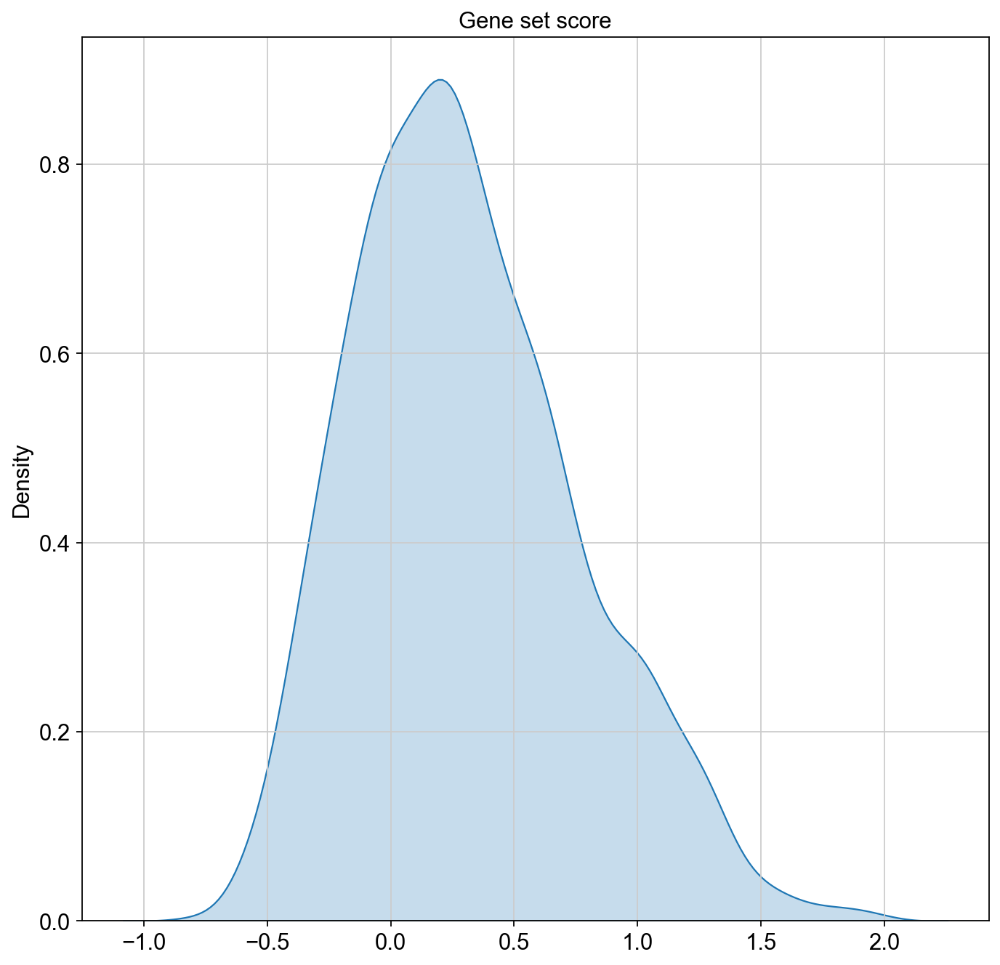

In [135]:
flatten_df1 = score.to_numpy().flatten()

sb.kdeplot(flatten_df1, fill = True) ; 

plt.title("Gene set score") ;

In [136]:
#Creating df containign surface protein data + scores for gene sets

a = score
b = prot

df =pd.concat([a, b], axis=1)


In [137]:
df

,marker_score,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,...,CD94,CD162,CD85j,CD23,CD328,HLA-E,CD82,CD101,CD88,CD224
GTAGTACCAATCCTTT-1-s4d1,0.294028,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,...,2.475005,1.804603,1.069921,1.496785,2.696518,1.532575,0.614600,0.900688,1.389844,0.918109
CTGTGGGTCATGCGGC-1-s4d1,-0.052074,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,...,1.408073,1.772872,0.890506,1.188863,2.678422,1.344431,0.353792,0.860303,0.979461,1.147198
GCAACATTCGCAAGAG-1-s4d1,-0.479867,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,...,2.174035,1.013704,1.148843,1.332566,0.000000,1.218539,0.670407,0.329073,1.280509,0.676616
TCACGGGTCGCACGAC-1-s4d1,-0.502191,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,...,3.016060,1.587440,1.623280,1.552023,2.164676,1.456232,0.614600,0.576253,1.189870,1.000442
CGCCAGAAGACCATTC-1-s4d1,-0.067529,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,...,2.826218,2.465725,1.524077,1.637802,3.066941,1.556781,0.276377,0.680162,1.415407,0.729806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,1.280152,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,...,4.481286,2.345961,0.391222,0.700530,4.391692,1.556781,0.353792,0.519947,0.809714,0.357584
ACATTTCCAGCAGTGA-1-s1d3,1.486468,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,...,2.122566,1.496074,0.391222,0.410393,2.678422,0.950948,0.555495,0.519947,0.546717,0.194691
TGAGACTTCCTTCAGC-1-s1d3,1.267104,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,...,0.365443,1.296756,0.214622,0.410393,3.910620,0.374154,0.492675,0.396827,0.418509,0.000000
GAGATGGTCCGCCTAT-1-s1d3,0.504323,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,...,2.986818,1.976363,0.214622,0.990050,1.800479,1.532575,0.555495,0.576253,0.546717,0.430053


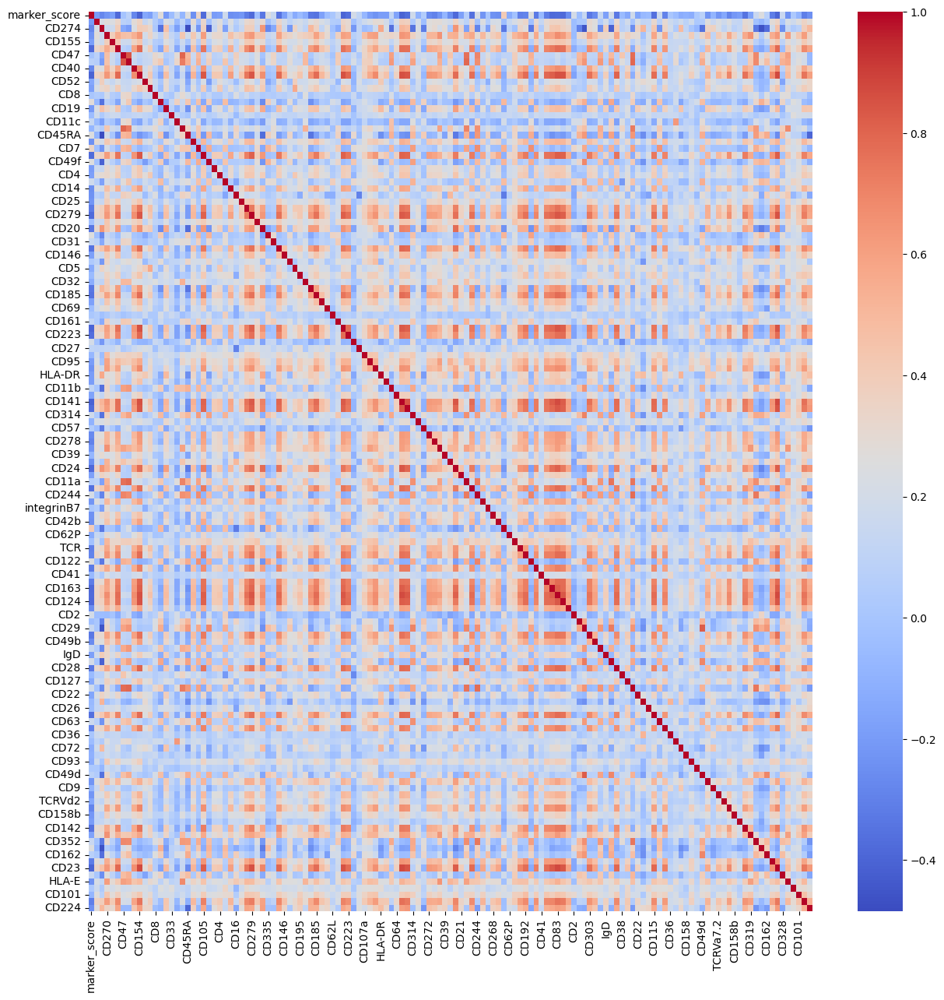

In [30]:
plt.figure(figsize=(15,15))
sb.heatmap(data=df.corr(),cmap='coolwarm')
plt.show()

In [31]:
df

,marker_score,CD86,CD274,CD270,CD155,CD112,CD47,CD48,CD40,CD154,...,CD94,CD162,CD85j,CD23,CD328,HLA-E,CD82,CD101,CD88,CD224
GTAGTACCAATCCTTT-1-s4d1,0.294028,0.652674,1.447594,1.489354,0.890243,1.290341,1.988618,1.733474,0.850004,1.531390,...,2.475005,1.804603,1.069921,1.496785,2.696518,1.532575,0.614600,0.900688,1.389844,0.918109
CTGTGGGTCATGCGGC-1-s4d1,-0.052074,0.378666,1.132949,1.153412,0.730824,1.195368,1.546005,1.090567,1.173337,1.303511,...,1.408073,1.772872,0.890506,1.188863,2.678422,1.344431,0.353792,0.860303,0.979461,1.147198
GCAACATTCGCAAGAG-1-s4d1,-0.479867,0.378666,1.192753,1.208881,0.000000,1.456877,1.046035,1.333993,0.638218,1.360894,...,2.174035,1.013704,1.148843,1.332566,0.000000,1.218539,0.670407,0.329073,1.280509,0.676616
TCACGGGTCGCACGAC-1-s4d1,-0.502191,0.000000,0.849902,1.548700,0.730824,1.530781,1.883102,1.686271,1.240123,1.804089,...,3.016060,1.587440,1.623280,1.552023,2.164676,1.456232,0.614600,0.576253,1.189870,1.000442
CGCCAGAAGACCATTC-1-s4d1,-0.067529,0.652674,1.249182,1.404314,0.306698,1.417770,1.664855,1.409627,1.302726,1.663363,...,2.826218,2.465725,1.524077,1.637802,3.066941,1.556781,0.276377,0.680162,1.415407,0.729806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATTCGTCCAATCA-1-s1d3,1.280152,0.000000,0.568367,1.124479,1.027708,0.600556,2.007513,1.679342,0.749707,0.545181,...,4.481286,2.345961,0.391222,0.700530,4.391692,1.556781,0.353792,0.519947,0.809714,0.357584
ACATTTCCAGCAGTGA-1-s1d3,1.486468,0.000000,0.671273,0.856802,0.000000,0.284617,1.105431,0.818721,0.201533,0.309292,...,2.122566,1.496074,0.391222,0.410393,2.678422,0.950948,0.555495,0.519947,0.546717,0.194691
TGAGACTTCCTTCAGC-1-s1d3,1.267104,0.000000,0.671273,0.734526,0.306698,0.284617,1.255114,1.174628,0.749707,0.625887,...,0.365443,1.296756,0.214622,0.410393,3.910620,0.374154,0.492675,0.396827,0.418509,0.000000
GAGATGGTCCGCCTAT-1-s1d3,0.504323,0.000000,0.928521,0.999570,0.541080,0.600556,1.759143,2.420602,1.024682,0.700563,...,2.986818,1.976363,0.214622,0.990050,1.800479,1.532575,0.555495,0.576253,0.546717,0.430053


## 1. RandomForestRegressor

In [32]:
#Random forest

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params = {#'bootstrap': [True, False],
 'max_depth': [3,5,7],
 #'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'],
 'min_samples_leaf': [2, 5, 10],
 #'min_samples_split': [2, 5, 10] ,
 #'n_estimators': [10, 50, 100]
}


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(RandomForestRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model = result.best_estimator_
y_pred = best_model.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)
    

Mean squared error: 0.14 R2 score: 0.39


In [33]:
#Mean training scores

print(mean_train_score)

[array([-0.12783664, -0.12800892, -0.12813005, -0.09992707, -0.10066909,
       -0.10362351, -0.07069859, -0.07394711, -0.08193304])]


In [34]:
# The best score and parameters

print(result.best_score_)
print(result.best_params_)

-0.1303942147217076
{'max_depth': 7, 'min_samples_leaf': 5}


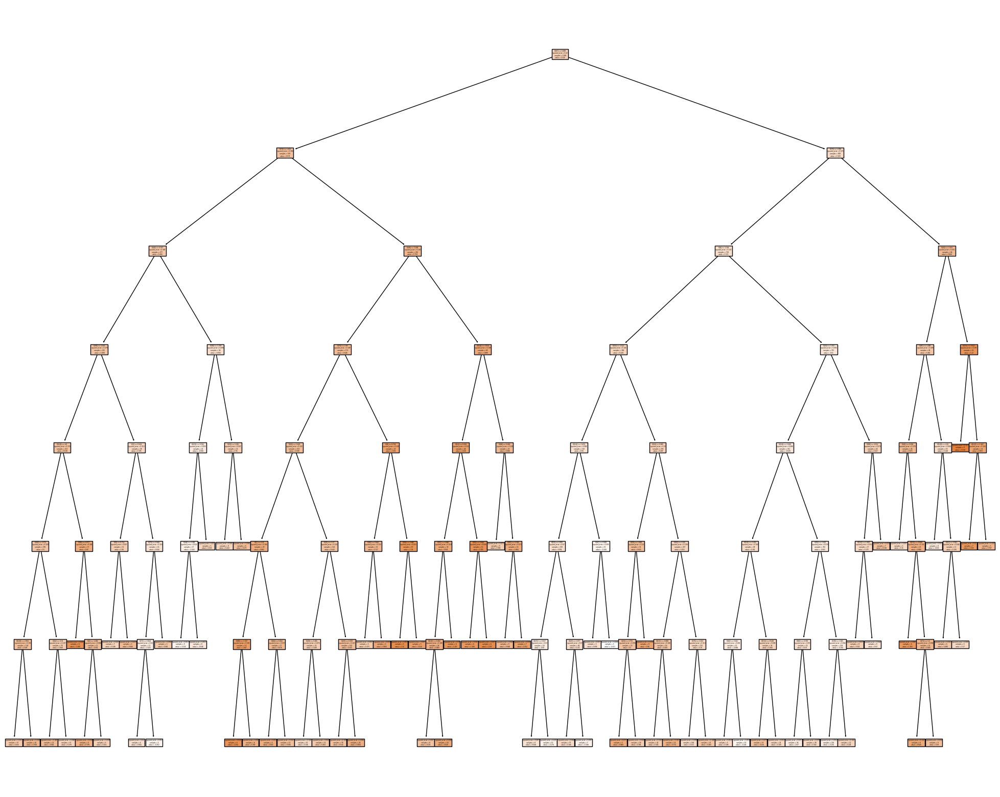

In [35]:
from sklearn import tree

plt.figure(figsize=(25, 20)) # Resize figure
tree.plot_tree(best_model.estimators_[0], filled = True) ;

plt.show()

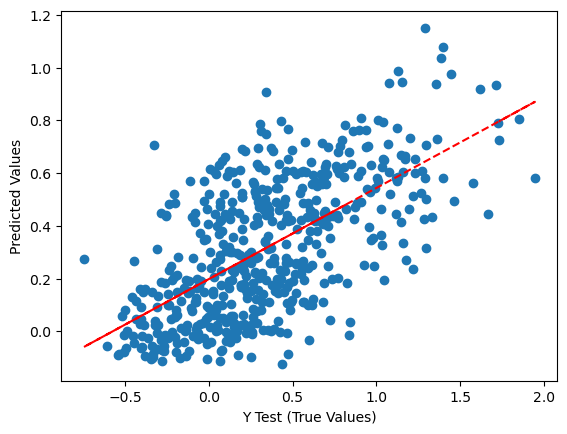

In [36]:
plt.scatter(y_test, y_pred)

# Add a trendline
z = np.polyfit(y_test, y_pred, 1)
p = np.poly1d(z)
plt.plot(y_test, p(y_test), 'r--')
# Add labels
plt.xlabel('Y Test (True Values)')
plt.ylabel('Predicted Values')
plt.show()

<AxesSubplot: xlabel='marker_score', ylabel='Density'>

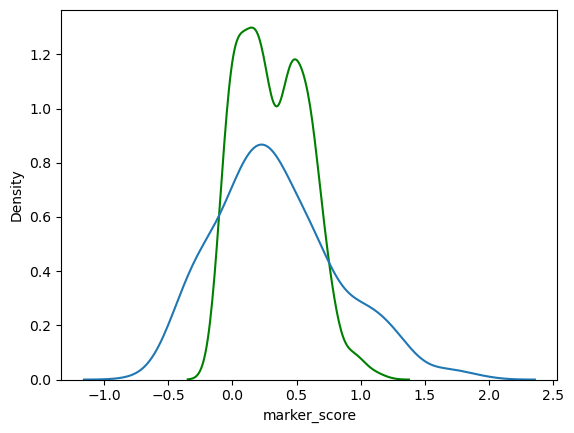

In [37]:
sb.kdeplot(y_pred, color = "g") #predicted values
sb.kdeplot(y_test) #observed values

In [38]:
#Feature importances

importances_rf = best_model.feature_importances_
importances_rf = pd.Series(importances_rf, index=prot.columns)
importances_rf=importances_rf.sort_values(ascending=False)

print(importances_rf.head(10))

CD24     0.181276
CD54     0.108630
CD7      0.046699
CD16     0.044443
CD163    0.038713
CD69     0.030964
CD196    0.029589
KLRG1    0.022831
CD154    0.022488
CD274    0.020486
dtype: float64


In [39]:
#df from the top 20 important markers
importances_rf=pd.DataFrame(importances_rf)
importances_rf_top=importances_rf[0:20]
importances_rf_top=importances_rf_top.T

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


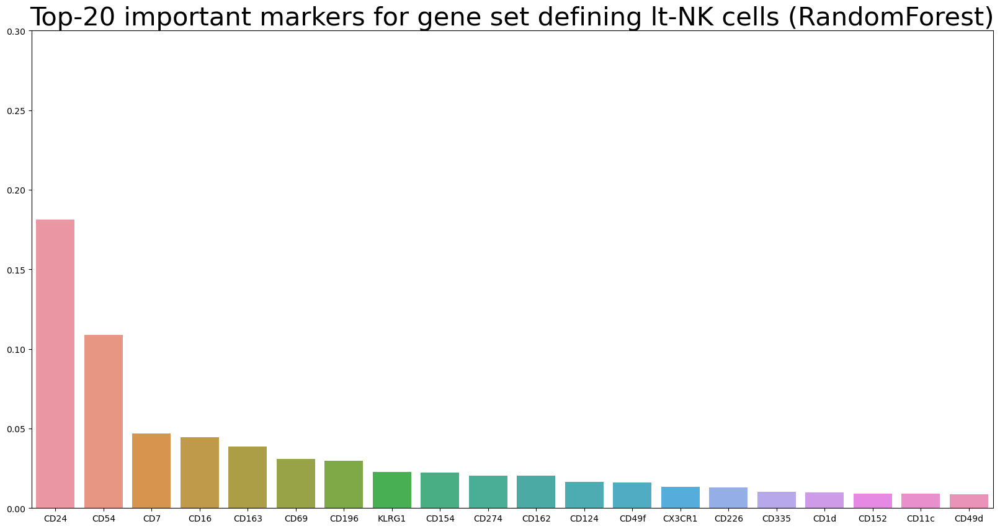

In [56]:
plt.figure(figsize=(20,10))
plt.ylim(0,0.3)
a=sb.barplot(data=importances_rf_top)

plt.title("Top-20 important markers for gene set defining lt-NK cells (RandomForest)", fontsize = 30) ;


## 2. Dummy Reggressor

In [41]:
from sklearn.dummy import DummyRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params =  {'strategy': ["mean", "median"]}


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(DummyRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model_dummy = result.best_estimator_
y_pred = best_model_dummy.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)

Mean squared error: 0.23 R2 score: -0.01


In [42]:
print(mean_train_score)

[array([-0.20515546, -0.20846159])]


## 3. GragientBoostingRegressor

In [43]:
#Gradient boosting regressor

from sklearn.ensemble import GradientBoostingRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params =  {'max_depth': [3,5,7],
          'min_samples_leaf': [2, 5, 10]}


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(GradientBoostingRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model_gbr = result.best_estimator_
y_pred = best_model_gbr.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)

Mean squared error: 0.14 R2 score: 0.38


In [44]:
print(mean_train_score)

[array([-0.07029302, -0.07070721, -0.07050244, -0.01916141, -0.01971981,
       -0.02324891, -0.00181906, -0.0021586 , -0.00452263])]


<AxesSubplot: xlabel='marker_score', ylabel='Density'>

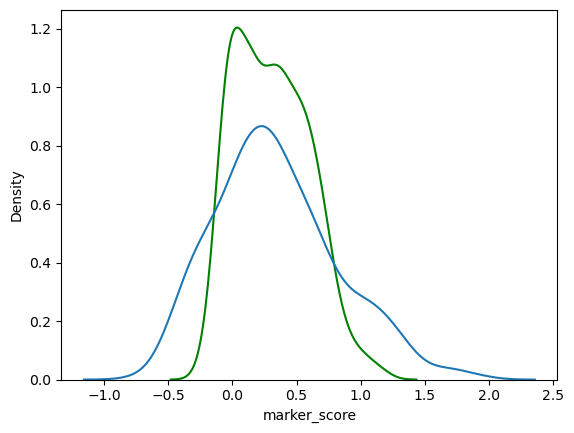

In [45]:
sb.kdeplot(y_pred, color = "g")
sb.kdeplot(y_test)

In [46]:
importances_gbr = best_model_gbr.feature_importances_
importances_gbr = pd.Series(importances_gbr, index=prot.columns)
importances_gbr=importances_gbr.sort_values(ascending=False)

print(importances_gbr.head(10))

CD24     0.119306
CD54     0.117501
CD163    0.072190
CD7      0.058980
CD16     0.042120
CD154    0.038257
KLRG1    0.030262
CD162    0.022596
CD83     0.021736
CD69     0.021498
dtype: float64


In [47]:
#df from the top 20 important markers
importances_gbr=pd.DataFrame(importances_gbr)
importances_gbr_top=importances_gbr[0:20]
importances_gbr_top=importances_gbr_top.T

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


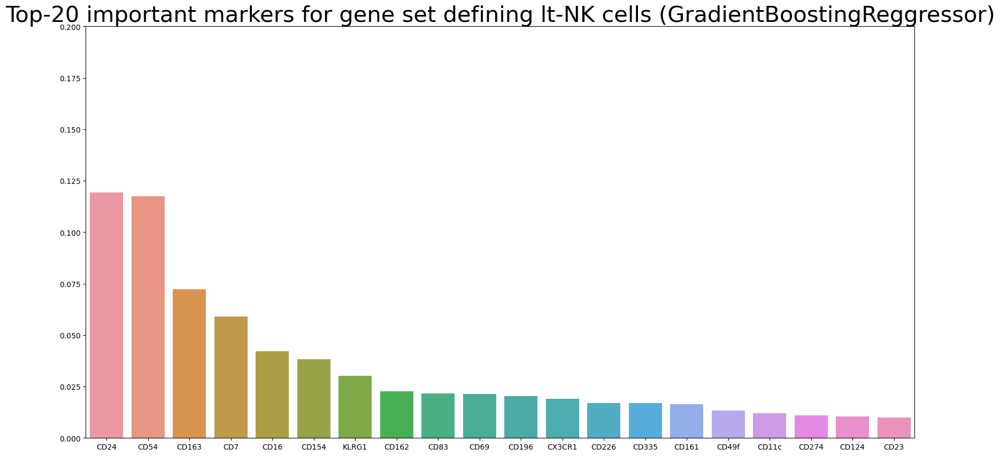

In [58]:
plt.figure(figsize=(20,10))
plt.ylim(0,0.2)
a=sb.barplot(data=importances_gbr_top)

plt.title("Top-20 important markers for gene set defining lt-NK cells (GradientBoostingReggressor)", fontsize = 30) ;



## 4. CatBoostRegressor

In [49]:
from catboost import CatBoostRegressor

X = df.iloc[:, 1:]
y = df['marker_score']

mean_train_score = []

params= {'depth': [6,8,10],
        'learning_rate' : [0.01, 0.05, 0.1],
        'iterations'    : [30, 50, 100]
                 }

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


#Step 2: hyperparameter search
search= GridSearchCV(CatBoostRegressor(), params, cv= 10, scoring='neg_mean_squared_error', return_train_score = True)
result = search.fit(X_train,y_train)
#collecting training scores and saving into mean_train_score
train_scores_mean = (search.cv_results_['mean_train_score']) 
mean_train_score.append(train_scores_mean)
#Step 3: Performance on test set
best_model_cb = result.best_estimator_
y_pred = best_model_cb.predict(X_test)

MSE = mean_squared_error(y_test, y_pred)
R2= r2_score(y_test, y_pred)
    
print("Mean squared error: %.2f" % MSE, 'R2 score: %.2f'% R2)

0:	learn: 0.4546778	total: 85.1ms	remaining: 2.47s
1:	learn: 0.4534312	total: 98.1ms	remaining: 1.37s
2:	learn: 0.4522327	total: 110ms	remaining: 988ms
3:	learn: 0.4509557	total: 117ms	remaining: 761ms
4:	learn: 0.4497405	total: 129ms	remaining: 643ms
5:	learn: 0.4486028	total: 145ms	remaining: 579ms
6:	learn: 0.4474982	total: 152ms	remaining: 500ms
7:	learn: 0.4463466	total: 163ms	remaining: 448ms
8:	learn: 0.4451919	total: 178ms	remaining: 416ms
9:	learn: 0.4440210	total: 189ms	remaining: 379ms
10:	learn: 0.4429586	total: 206ms	remaining: 356ms
11:	learn: 0.4418255	total: 218ms	remaining: 327ms
12:	learn: 0.4408129	total: 231ms	remaining: 302ms
13:	learn: 0.4397853	total: 243ms	remaining: 277ms
14:	learn: 0.4387692	total: 260ms	remaining: 260ms
15:	learn: 0.4377512	total: 268ms	remaining: 235ms
16:	learn: 0.4367251	total: 290ms	remaining: 222ms
17:	learn: 0.4357033	total: 301ms	remaining: 201ms
18:	learn: 0.4346919	total: 318ms	remaining: 184ms
19:	learn: 0.4337218	total: 327ms	remai

28:	learn: 0.4236797	total: 340ms	remaining: 11.7ms
29:	learn: 0.4227995	total: 349ms	remaining: 0us
0:	learn: 0.4517479	total: 5.61ms	remaining: 163ms
1:	learn: 0.4505281	total: 21.1ms	remaining: 296ms
2:	learn: 0.4494204	total: 32.7ms	remaining: 295ms
3:	learn: 0.4481177	total: 42.3ms	remaining: 275ms
4:	learn: 0.4468637	total: 50.7ms	remaining: 253ms
5:	learn: 0.4457509	total: 59.3ms	remaining: 237ms
6:	learn: 0.4445511	total: 65.4ms	remaining: 215ms
7:	learn: 0.4435079	total: 74ms	remaining: 204ms
8:	learn: 0.4424084	total: 85.1ms	remaining: 199ms
9:	learn: 0.4412362	total: 96.2ms	remaining: 192ms
10:	learn: 0.4400920	total: 103ms	remaining: 178ms
11:	learn: 0.4390955	total: 114ms	remaining: 171ms
12:	learn: 0.4379831	total: 132ms	remaining: 173ms
13:	learn: 0.4369407	total: 138ms	remaining: 157ms
14:	learn: 0.4359331	total: 147ms	remaining: 147ms
15:	learn: 0.4348735	total: 170ms	remaining: 149ms
16:	learn: 0.4339077	total: 176ms	remaining: 135ms
17:	learn: 0.4328740	total: 188ms	

9:	learn: 0.4034255	total: 136ms	remaining: 271ms
10:	learn: 0.3997517	total: 152ms	remaining: 262ms
11:	learn: 0.3963131	total: 167ms	remaining: 250ms
12:	learn: 0.3935906	total: 177ms	remaining: 231ms
13:	learn: 0.3905539	total: 188ms	remaining: 215ms
14:	learn: 0.3880006	total: 198ms	remaining: 198ms
15:	learn: 0.3850975	total: 206ms	remaining: 180ms
16:	learn: 0.3829549	total: 217ms	remaining: 166ms
17:	learn: 0.3805957	total: 232ms	remaining: 155ms
18:	learn: 0.3781739	total: 240ms	remaining: 139ms
19:	learn: 0.3760363	total: 255ms	remaining: 127ms
20:	learn: 0.3741192	total: 261ms	remaining: 112ms
21:	learn: 0.3723066	total: 272ms	remaining: 99ms
22:	learn: 0.3706697	total: 289ms	remaining: 88ms
23:	learn: 0.3688089	total: 298ms	remaining: 74.4ms
24:	learn: 0.3670995	total: 305ms	remaining: 60.9ms
25:	learn: 0.3655878	total: 324ms	remaining: 49.8ms
26:	learn: 0.3643725	total: 331ms	remaining: 36.8ms
27:	learn: 0.3631693	total: 354ms	remaining: 25.3ms
28:	learn: 0.3617849	total: 3

25:	learn: 0.3675504	total: 380ms	remaining: 58.4ms
26:	learn: 0.3663617	total: 396ms	remaining: 44ms
27:	learn: 0.3650434	total: 403ms	remaining: 28.8ms
28:	learn: 0.3636057	total: 417ms	remaining: 14.4ms
29:	learn: 0.3622792	total: 429ms	remaining: 0us
0:	learn: 0.4448530	total: 25.8ms	remaining: 749ms
1:	learn: 0.4392388	total: 45.4ms	remaining: 636ms
2:	learn: 0.4341377	total: 63.2ms	remaining: 569ms
3:	learn: 0.4291507	total: 74.3ms	remaining: 483ms
4:	learn: 0.4245697	total: 100ms	remaining: 501ms
5:	learn: 0.4207020	total: 127ms	remaining: 509ms
6:	learn: 0.4161105	total: 141ms	remaining: 462ms
7:	learn: 0.4125280	total: 158ms	remaining: 434ms
8:	learn: 0.4091178	total: 169ms	remaining: 395ms
9:	learn: 0.4054987	total: 178ms	remaining: 356ms
10:	learn: 0.4020871	total: 190ms	remaining: 328ms
11:	learn: 0.3986201	total: 205ms	remaining: 308ms
12:	learn: 0.3959834	total: 215ms	remaining: 281ms
13:	learn: 0.3935696	total: 229ms	remaining: 262ms
14:	learn: 0.3909434	total: 245ms	rem

18:	learn: 0.3541809	total: 216ms	remaining: 125ms
19:	learn: 0.3525666	total: 223ms	remaining: 112ms
20:	learn: 0.3505158	total: 239ms	remaining: 102ms
21:	learn: 0.3488832	total: 252ms	remaining: 91.7ms
22:	learn: 0.3469281	total: 261ms	remaining: 79.5ms
23:	learn: 0.3448793	total: 279ms	remaining: 69.7ms
24:	learn: 0.3433587	total: 288ms	remaining: 57.5ms
25:	learn: 0.3417686	total: 310ms	remaining: 47.7ms
26:	learn: 0.3403965	total: 320ms	remaining: 35.5ms
27:	learn: 0.3392754	total: 329ms	remaining: 23.5ms
28:	learn: 0.3372812	total: 343ms	remaining: 11.8ms
29:	learn: 0.3362977	total: 349ms	remaining: 0us
0:	learn: 0.4443828	total: 7.04ms	remaining: 204ms
1:	learn: 0.4332690	total: 20ms	remaining: 281ms
2:	learn: 0.4240714	total: 34.5ms	remaining: 311ms
3:	learn: 0.4154127	total: 42.2ms	remaining: 274ms
4:	learn: 0.4086647	total: 56ms	remaining: 280ms
5:	learn: 0.4029923	total: 68.2ms	remaining: 273ms
6:	learn: 0.3962355	total: 77.7ms	remaining: 255ms
7:	learn: 0.3907161	total: 92

29:	learn: 0.3365965	total: 345ms	remaining: 0us
0:	learn: 0.4397150	total: 11.6ms	remaining: 336ms
1:	learn: 0.4294050	total: 22.9ms	remaining: 321ms
2:	learn: 0.4191984	total: 45.7ms	remaining: 412ms
3:	learn: 0.4110250	total: 51.2ms	remaining: 333ms
4:	learn: 0.4039913	total: 57.9ms	remaining: 290ms
5:	learn: 0.3989510	total: 75.2ms	remaining: 301ms
6:	learn: 0.3929992	total: 82.5ms	remaining: 271ms
7:	learn: 0.3877313	total: 108ms	remaining: 296ms
8:	learn: 0.3833110	total: 115ms	remaining: 267ms
9:	learn: 0.3788622	total: 129ms	remaining: 257ms
10:	learn: 0.3744303	total: 141ms	remaining: 244ms
11:	learn: 0.3702515	total: 149ms	remaining: 223ms
12:	learn: 0.3672511	total: 157ms	remaining: 205ms
13:	learn: 0.3647294	total: 172ms	remaining: 197ms
14:	learn: 0.3625159	total: 180ms	remaining: 180ms
15:	learn: 0.3600851	total: 202ms	remaining: 177ms
16:	learn: 0.3578748	total: 211ms	remaining: 161ms
17:	learn: 0.3556180	total: 221ms	remaining: 147ms
18:	learn: 0.3526088	total: 239ms	re

14:	learn: 0.4369221	total: 180ms	remaining: 420ms
15:	learn: 0.4359334	total: 204ms	remaining: 433ms
16:	learn: 0.4349969	total: 209ms	remaining: 406ms
17:	learn: 0.4339938	total: 223ms	remaining: 397ms
18:	learn: 0.4331063	total: 230ms	remaining: 375ms
19:	learn: 0.4321280	total: 240ms	remaining: 359ms
20:	learn: 0.4311861	total: 254ms	remaining: 350ms
21:	learn: 0.4301732	total: 259ms	remaining: 329ms
22:	learn: 0.4291147	total: 270ms	remaining: 317ms
23:	learn: 0.4280841	total: 287ms	remaining: 311ms
24:	learn: 0.4271498	total: 295ms	remaining: 295ms
25:	learn: 0.4262325	total: 313ms	remaining: 289ms
26:	learn: 0.4254030	total: 324ms	remaining: 276ms
27:	learn: 0.4246361	total: 331ms	remaining: 260ms
28:	learn: 0.4237948	total: 348ms	remaining: 252ms
29:	learn: 0.4228163	total: 357ms	remaining: 238ms
30:	learn: 0.4218708	total: 371ms	remaining: 227ms
31:	learn: 0.4209769	total: 385ms	remaining: 217ms
32:	learn: 0.4200831	total: 395ms	remaining: 203ms
33:	learn: 0.4191920	total: 416

38:	learn: 0.4149583	total: 489ms	remaining: 138ms
39:	learn: 0.4142081	total: 509ms	remaining: 127ms
40:	learn: 0.4134487	total: 518ms	remaining: 114ms
41:	learn: 0.4126775	total: 535ms	remaining: 102ms
42:	learn: 0.4119773	total: 541ms	remaining: 88ms
43:	learn: 0.4113966	total: 549ms	remaining: 74.9ms
44:	learn: 0.4105288	total: 561ms	remaining: 62.3ms
45:	learn: 0.4098194	total: 573ms	remaining: 49.8ms
46:	learn: 0.4091628	total: 578ms	remaining: 36.9ms
47:	learn: 0.4084810	total: 598ms	remaining: 24.9ms
48:	learn: 0.4078147	total: 612ms	remaining: 12.5ms
49:	learn: 0.4071198	total: 630ms	remaining: 0us
0:	learn: 0.4517479	total: 17ms	remaining: 831ms
1:	learn: 0.4505281	total: 23ms	remaining: 551ms
2:	learn: 0.4494204	total: 35.1ms	remaining: 550ms
3:	learn: 0.4481177	total: 51.9ms	remaining: 597ms
4:	learn: 0.4468637	total: 62ms	remaining: 558ms
5:	learn: 0.4457509	total: 79.5ms	remaining: 583ms
6:	learn: 0.4445511	total: 91.6ms	remaining: 563ms
7:	learn: 0.4435079	total: 108ms	r

2:	learn: 0.4482768	total: 36.9ms	remaining: 577ms
3:	learn: 0.4470623	total: 56ms	remaining: 644ms
4:	learn: 0.4458662	total: 63.2ms	remaining: 569ms
5:	learn: 0.4448245	total: 82.8ms	remaining: 607ms
6:	learn: 0.4436032	total: 87.6ms	remaining: 538ms
7:	learn: 0.4425102	total: 93.7ms	remaining: 492ms
8:	learn: 0.4413569	total: 99.8ms	remaining: 455ms
9:	learn: 0.4402443	total: 106ms	remaining: 425ms
10:	learn: 0.4391562	total: 113ms	remaining: 402ms
11:	learn: 0.4380083	total: 119ms	remaining: 376ms
12:	learn: 0.4370316	total: 127ms	remaining: 362ms
13:	learn: 0.4360516	total: 137ms	remaining: 352ms
14:	learn: 0.4349940	total: 151ms	remaining: 352ms
15:	learn: 0.4339284	total: 158ms	remaining: 337ms
16:	learn: 0.4329766	total: 169ms	remaining: 328ms
17:	learn: 0.4318934	total: 184ms	remaining: 327ms
18:	learn: 0.4309739	total: 194ms	remaining: 317ms
19:	learn: 0.4300508	total: 208ms	remaining: 312ms
20:	learn: 0.4290761	total: 216ms	remaining: 299ms
21:	learn: 0.4280675	total: 228ms	

25:	learn: 0.3677809	total: 335ms	remaining: 309ms
26:	learn: 0.3665337	total: 355ms	remaining: 302ms
27:	learn: 0.3655513	total: 365ms	remaining: 287ms
28:	learn: 0.3641548	total: 375ms	remaining: 271ms
29:	learn: 0.3624755	total: 391ms	remaining: 261ms
30:	learn: 0.3609409	total: 403ms	remaining: 247ms
31:	learn: 0.3597350	total: 421ms	remaining: 237ms
32:	learn: 0.3581215	total: 427ms	remaining: 220ms
33:	learn: 0.3569571	total: 435ms	remaining: 205ms
34:	learn: 0.3558343	total: 451ms	remaining: 193ms
35:	learn: 0.3545769	total: 460ms	remaining: 179ms
36:	learn: 0.3535240	total: 474ms	remaining: 167ms
37:	learn: 0.3524498	total: 490ms	remaining: 155ms
38:	learn: 0.3514108	total: 501ms	remaining: 141ms
39:	learn: 0.3503415	total: 514ms	remaining: 128ms
40:	learn: 0.3493451	total: 522ms	remaining: 115ms
41:	learn: 0.3484695	total: 534ms	remaining: 102ms
42:	learn: 0.3475010	total: 548ms	remaining: 89.2ms
43:	learn: 0.3463443	total: 570ms	remaining: 77.8ms
44:	learn: 0.3451064	total: 5

39:	learn: 0.3534520	total: 541ms	remaining: 135ms
40:	learn: 0.3524063	total: 559ms	remaining: 123ms
41:	learn: 0.3514948	total: 566ms	remaining: 108ms
42:	learn: 0.3503574	total: 578ms	remaining: 94.2ms
43:	learn: 0.3492453	total: 593ms	remaining: 80.9ms
44:	learn: 0.3481069	total: 599ms	remaining: 66.6ms
45:	learn: 0.3472210	total: 613ms	remaining: 53.3ms
46:	learn: 0.3464435	total: 626ms	remaining: 40ms
47:	learn: 0.3456636	total: 635ms	remaining: 26.4ms
48:	learn: 0.3448628	total: 653ms	remaining: 13.3ms
49:	learn: 0.3440720	total: 665ms	remaining: 0us
0:	learn: 0.4467316	total: 4.63ms	remaining: 227ms
1:	learn: 0.4410275	total: 11.4ms	remaining: 273ms
2:	learn: 0.4352025	total: 20.5ms	remaining: 321ms
3:	learn: 0.4299820	total: 32.8ms	remaining: 377ms
4:	learn: 0.4248630	total: 45.7ms	remaining: 411ms
5:	learn: 0.4203669	total: 59.1ms	remaining: 433ms
6:	learn: 0.4160631	total: 67.6ms	remaining: 415ms
7:	learn: 0.4123935	total: 72.9ms	remaining: 382ms
8:	learn: 0.4086872	total: 9

1:	learn: 0.4397456	total: 27.4ms	remaining: 657ms
2:	learn: 0.4350006	total: 35.4ms	remaining: 555ms
3:	learn: 0.4297318	total: 55.3ms	remaining: 636ms
4:	learn: 0.4248220	total: 62.2ms	remaining: 560ms
5:	learn: 0.4201737	total: 80.9ms	remaining: 593ms
6:	learn: 0.4155418	total: 90.3ms	remaining: 554ms
7:	learn: 0.4120993	total: 103ms	remaining: 539ms
8:	learn: 0.4083647	total: 116ms	remaining: 530ms
9:	learn: 0.4043771	total: 126ms	remaining: 503ms
10:	learn: 0.4008734	total: 136ms	remaining: 483ms
11:	learn: 0.3979282	total: 148ms	remaining: 468ms
12:	learn: 0.3952153	total: 155ms	remaining: 440ms
13:	learn: 0.3927210	total: 162ms	remaining: 418ms
14:	learn: 0.3901061	total: 179ms	remaining: 417ms
15:	learn: 0.3876136	total: 184ms	remaining: 390ms
16:	learn: 0.3853955	total: 197ms	remaining: 383ms
17:	learn: 0.3827234	total: 209ms	remaining: 371ms
18:	learn: 0.3808107	total: 217ms	remaining: 355ms
19:	learn: 0.3788204	total: 228ms	remaining: 342ms
20:	learn: 0.3769770	total: 240ms	

16:	learn: 0.3582768	total: 828ms	remaining: 1.61s
17:	learn: 0.3562499	total: 868ms	remaining: 1.54s
18:	learn: 0.3541809	total: 915ms	remaining: 1.49s
19:	learn: 0.3525666	total: 980ms	remaining: 1.47s
20:	learn: 0.3505158	total: 1.02s	remaining: 1.41s
21:	learn: 0.3488832	total: 1.08s	remaining: 1.37s
22:	learn: 0.3469281	total: 1.14s	remaining: 1.33s
23:	learn: 0.3448793	total: 1.18s	remaining: 1.28s
24:	learn: 0.3433587	total: 1.23s	remaining: 1.23s
25:	learn: 0.3417686	total: 1.26s	remaining: 1.17s
26:	learn: 0.3403965	total: 1.32s	remaining: 1.13s
27:	learn: 0.3392754	total: 1.37s	remaining: 1.08s
28:	learn: 0.3372812	total: 1.45s	remaining: 1.05s
29:	learn: 0.3362977	total: 1.48s	remaining: 990ms
30:	learn: 0.3349430	total: 1.52s	remaining: 933ms
31:	learn: 0.3338989	total: 1.58s	remaining: 887ms
32:	learn: 0.3324201	total: 1.62s	remaining: 834ms
33:	learn: 0.3312747	total: 1.67s	remaining: 785ms
34:	learn: 0.3296300	total: 1.73s	remaining: 743ms
35:	learn: 0.3284025	total: 1.7

32:	learn: 0.3320551	total: 429ms	remaining: 221ms
33:	learn: 0.3306781	total: 447ms	remaining: 210ms
34:	learn: 0.3290187	total: 471ms	remaining: 202ms
35:	learn: 0.3282644	total: 491ms	remaining: 191ms
36:	learn: 0.3268833	total: 498ms	remaining: 175ms
37:	learn: 0.3257268	total: 509ms	remaining: 161ms
38:	learn: 0.3244854	total: 524ms	remaining: 148ms
39:	learn: 0.3228748	total: 533ms	remaining: 133ms
40:	learn: 0.3214858	total: 541ms	remaining: 119ms
41:	learn: 0.3206096	total: 548ms	remaining: 104ms
42:	learn: 0.3198382	total: 572ms	remaining: 93.1ms
43:	learn: 0.3191588	total: 581ms	remaining: 79.2ms
44:	learn: 0.3179956	total: 603ms	remaining: 66.9ms
45:	learn: 0.3175933	total: 611ms	remaining: 53.2ms
46:	learn: 0.3170592	total: 625ms	remaining: 39.9ms
47:	learn: 0.3157194	total: 643ms	remaining: 26.8ms
48:	learn: 0.3145227	total: 654ms	remaining: 13.3ms
49:	learn: 0.3133326	total: 666ms	remaining: 0us
0:	learn: 0.4406584	total: 8.34ms	remaining: 409ms
1:	learn: 0.4302093	total:

5:	learn: 0.3980225	total: 77ms	remaining: 565ms
6:	learn: 0.3913225	total: 94.1ms	remaining: 578ms
7:	learn: 0.3868094	total: 103ms	remaining: 542ms
8:	learn: 0.3819114	total: 120ms	remaining: 549ms
9:	learn: 0.3774136	total: 127ms	remaining: 509ms
10:	learn: 0.3734923	total: 135ms	remaining: 477ms
11:	learn: 0.3700141	total: 146ms	remaining: 462ms
12:	learn: 0.3672231	total: 157ms	remaining: 447ms
13:	learn: 0.3644488	total: 163ms	remaining: 420ms
14:	learn: 0.3618661	total: 184ms	remaining: 429ms
15:	learn: 0.3598172	total: 190ms	remaining: 403ms
16:	learn: 0.3580951	total: 202ms	remaining: 391ms
17:	learn: 0.3559291	total: 213ms	remaining: 378ms
18:	learn: 0.3538813	total: 220ms	remaining: 359ms
19:	learn: 0.3521638	total: 227ms	remaining: 341ms
20:	learn: 0.3503896	total: 252ms	remaining: 347ms
21:	learn: 0.3492575	total: 260ms	remaining: 330ms
22:	learn: 0.3476724	total: 270ms	remaining: 317ms
23:	learn: 0.3455854	total: 285ms	remaining: 309ms
24:	learn: 0.3440348	total: 294ms	re

20:	learn: 0.4261597	total: 288ms	remaining: 1.08s
21:	learn: 0.4251795	total: 301ms	remaining: 1.07s
22:	learn: 0.4243284	total: 310ms	remaining: 1.04s
23:	learn: 0.4233405	total: 329ms	remaining: 1.04s
24:	learn: 0.4223791	total: 336ms	remaining: 1.01s
25:	learn: 0.4215028	total: 349ms	remaining: 993ms
26:	learn: 0.4205307	total: 364ms	remaining: 985ms
27:	learn: 0.4197413	total: 372ms	remaining: 958ms
28:	learn: 0.4189529	total: 383ms	remaining: 938ms
29:	learn: 0.4180438	total: 400ms	remaining: 934ms
30:	learn: 0.4172338	total: 406ms	remaining: 903ms
31:	learn: 0.4164384	total: 414ms	remaining: 880ms
32:	learn: 0.4156760	total: 438ms	remaining: 890ms
33:	learn: 0.4148708	total: 451ms	remaining: 875ms
34:	learn: 0.4139863	total: 460ms	remaining: 853ms
35:	learn: 0.4131918	total: 475ms	remaining: 845ms
36:	learn: 0.4124036	total: 484ms	remaining: 825ms
37:	learn: 0.4116680	total: 503ms	remaining: 820ms
38:	learn: 0.4109614	total: 513ms	remaining: 802ms
39:	learn: 0.4102006	total: 525

95:	learn: 0.3811402	total: 1.11s	remaining: 46.4ms
96:	learn: 0.3806981	total: 1.12s	remaining: 34.7ms
97:	learn: 0.3802205	total: 1.15s	remaining: 23.5ms
98:	learn: 0.3798335	total: 1.16s	remaining: 11.7ms
99:	learn: 0.3794492	total: 1.18s	remaining: 0us
0:	learn: 0.4558580	total: 5.99ms	remaining: 593ms
1:	learn: 0.4546097	total: 30.3ms	remaining: 1.49s
2:	learn: 0.4533573	total: 40.6ms	remaining: 1.31s
3:	learn: 0.4520310	total: 53.5ms	remaining: 1.28s
4:	learn: 0.4507881	total: 67.9ms	remaining: 1.29s
5:	learn: 0.4496301	total: 77.4ms	remaining: 1.21s
6:	learn: 0.4484616	total: 87ms	remaining: 1.16s
7:	learn: 0.4474112	total: 101ms	remaining: 1.16s
8:	learn: 0.4462880	total: 108ms	remaining: 1.09s
9:	learn: 0.4451217	total: 118ms	remaining: 1.06s
10:	learn: 0.4439250	total: 134ms	remaining: 1.08s
11:	learn: 0.4427605	total: 140ms	remaining: 1.02s
12:	learn: 0.4417295	total: 163ms	remaining: 1.09s
13:	learn: 0.4406553	total: 174ms	remaining: 1.07s
14:	learn: 0.4396291	total: 185ms	

60:	learn: 0.3998322	total: 781ms	remaining: 499ms
61:	learn: 0.3992749	total: 798ms	remaining: 489ms
62:	learn: 0.3986940	total: 813ms	remaining: 478ms
63:	learn: 0.3980942	total: 824ms	remaining: 463ms
64:	learn: 0.3975200	total: 835ms	remaining: 449ms
65:	learn: 0.3968824	total: 848ms	remaining: 437ms
66:	learn: 0.3963496	total: 858ms	remaining: 422ms
67:	learn: 0.3958121	total: 874ms	remaining: 411ms
68:	learn: 0.3952926	total: 888ms	remaining: 399ms
69:	learn: 0.3947545	total: 904ms	remaining: 387ms
70:	learn: 0.3941813	total: 918ms	remaining: 375ms
71:	learn: 0.3936392	total: 927ms	remaining: 360ms
72:	learn: 0.3931081	total: 945ms	remaining: 349ms
73:	learn: 0.3925927	total: 953ms	remaining: 335ms
74:	learn: 0.3920726	total: 967ms	remaining: 322ms
75:	learn: 0.3916220	total: 979ms	remaining: 309ms
76:	learn: 0.3911162	total: 993ms	remaining: 297ms
77:	learn: 0.3906559	total: 1.01s	remaining: 284ms
78:	learn: 0.3900963	total: 1.01s	remaining: 270ms
79:	learn: 0.3896370	total: 1.0

27:	learn: 0.4237352	total: 357ms	remaining: 917ms
28:	learn: 0.4228627	total: 372ms	remaining: 910ms
29:	learn: 0.4219063	total: 384ms	remaining: 896ms
30:	learn: 0.4210980	total: 394ms	remaining: 878ms
31:	learn: 0.4202124	total: 410ms	remaining: 872ms
32:	learn: 0.4194111	total: 418ms	remaining: 848ms
33:	learn: 0.4185304	total: 430ms	remaining: 834ms
34:	learn: 0.4176156	total: 444ms	remaining: 825ms
35:	learn: 0.4167565	total: 454ms	remaining: 806ms
36:	learn: 0.4159440	total: 463ms	remaining: 789ms
37:	learn: 0.4151124	total: 476ms	remaining: 776ms
38:	learn: 0.4143512	total: 484ms	remaining: 757ms
39:	learn: 0.4135477	total: 502ms	remaining: 753ms
40:	learn: 0.4128256	total: 517ms	remaining: 745ms
41:	learn: 0.4121482	total: 526ms	remaining: 726ms
42:	learn: 0.4113826	total: 544ms	remaining: 722ms
43:	learn: 0.4106778	total: 550ms	remaining: 700ms
44:	learn: 0.4098634	total: 558ms	remaining: 682ms
45:	learn: 0.4091937	total: 566ms	remaining: 665ms
46:	learn: 0.4084529	total: 581

94:	learn: 0.3809004	total: 1.15s	remaining: 60.3ms
95:	learn: 0.3805120	total: 1.15s	remaining: 48ms
96:	learn: 0.3800341	total: 1.16s	remaining: 35.9ms
97:	learn: 0.3795685	total: 1.19s	remaining: 24.2ms
98:	learn: 0.3791496	total: 1.2s	remaining: 12.1ms
99:	learn: 0.3787574	total: 1.2s	remaining: 0us
0:	learn: 0.4504708	total: 13.3ms	remaining: 1.31s
1:	learn: 0.4492278	total: 18ms	remaining: 884ms
2:	learn: 0.4480547	total: 29.1ms	remaining: 940ms
3:	learn: 0.4469057	total: 42.6ms	remaining: 1.02s
4:	learn: 0.4457735	total: 50.2ms	remaining: 954ms
5:	learn: 0.4447702	total: 58.5ms	remaining: 916ms
6:	learn: 0.4436806	total: 66.9ms	remaining: 889ms
7:	learn: 0.4426592	total: 79.9ms	remaining: 919ms
8:	learn: 0.4415885	total: 86.7ms	remaining: 877ms
9:	learn: 0.4404449	total: 101ms	remaining: 913ms
10:	learn: 0.4393753	total: 118ms	remaining: 952ms
11:	learn: 0.4383058	total: 130ms	remaining: 956ms
12:	learn: 0.4373512	total: 144ms	remaining: 967ms
13:	learn: 0.4364264	total: 155ms	r

61:	learn: 0.3973738	total: 764ms	remaining: 468ms
62:	learn: 0.3967464	total: 780ms	remaining: 458ms
63:	learn: 0.3961752	total: 789ms	remaining: 444ms
64:	learn: 0.3955853	total: 809ms	remaining: 435ms
65:	learn: 0.3949290	total: 815ms	remaining: 420ms
66:	learn: 0.3943438	total: 829ms	remaining: 408ms
67:	learn: 0.3938145	total: 841ms	remaining: 396ms
68:	learn: 0.3933259	total: 847ms	remaining: 381ms
69:	learn: 0.3927067	total: 853ms	remaining: 366ms
70:	learn: 0.3921598	total: 876ms	remaining: 358ms
71:	learn: 0.3915546	total: 886ms	remaining: 345ms
72:	learn: 0.3910138	total: 897ms	remaining: 332ms
73:	learn: 0.3905033	total: 908ms	remaining: 319ms
74:	learn: 0.3899787	total: 913ms	remaining: 304ms
75:	learn: 0.3895136	total: 923ms	remaining: 291ms
76:	learn: 0.3889826	total: 940ms	remaining: 281ms
77:	learn: 0.3884067	total: 951ms	remaining: 268ms
78:	learn: 0.3878853	total: 968ms	remaining: 257ms
79:	learn: 0.3873765	total: 974ms	remaining: 244ms
80:	learn: 0.3868144	total: 995

29:	learn: 0.3605145	total: 378ms	remaining: 882ms
30:	learn: 0.3591048	total: 386ms	remaining: 859ms
31:	learn: 0.3577329	total: 404ms	remaining: 860ms
32:	learn: 0.3563813	total: 409ms	remaining: 830ms
33:	learn: 0.3550854	total: 421ms	remaining: 816ms
34:	learn: 0.3540695	total: 436ms	remaining: 809ms
35:	learn: 0.3530836	total: 457ms	remaining: 812ms
36:	learn: 0.3519534	total: 465ms	remaining: 792ms
37:	learn: 0.3509820	total: 471ms	remaining: 768ms
38:	learn: 0.3499232	total: 481ms	remaining: 753ms
39:	learn: 0.3489286	total: 488ms	remaining: 733ms
40:	learn: 0.3479940	total: 502ms	remaining: 723ms
41:	learn: 0.3470064	total: 511ms	remaining: 705ms
42:	learn: 0.3458469	total: 519ms	remaining: 688ms
43:	learn: 0.3449711	total: 532ms	remaining: 677ms
44:	learn: 0.3438351	total: 541ms	remaining: 662ms
45:	learn: 0.3430196	total: 559ms	remaining: 656ms
46:	learn: 0.3423379	total: 567ms	remaining: 640ms
47:	learn: 0.3416787	total: 578ms	remaining: 626ms
48:	learn: 0.3409471	total: 592

0:	learn: 0.4506682	total: 13.2ms	remaining: 1.3s
1:	learn: 0.4446190	total: 23.3ms	remaining: 1.14s
2:	learn: 0.4386058	total: 42.2ms	remaining: 1.36s
3:	learn: 0.4334943	total: 53.8ms	remaining: 1.29s
4:	learn: 0.4287063	total: 72.1ms	remaining: 1.37s
5:	learn: 0.4246194	total: 78.8ms	remaining: 1.23s
6:	learn: 0.4203115	total: 89ms	remaining: 1.18s
7:	learn: 0.4166897	total: 95.2ms	remaining: 1.09s
8:	learn: 0.4123126	total: 108ms	remaining: 1.09s
9:	learn: 0.4085892	total: 121ms	remaining: 1.08s
10:	learn: 0.4047953	total: 137ms	remaining: 1.11s
11:	learn: 0.4012651	total: 146ms	remaining: 1.07s
12:	learn: 0.3984597	total: 159ms	remaining: 1.06s
13:	learn: 0.3953773	total: 172ms	remaining: 1.06s
14:	learn: 0.3926934	total: 188ms	remaining: 1.06s
15:	learn: 0.3899464	total: 208ms	remaining: 1.09s
16:	learn: 0.3873247	total: 226ms	remaining: 1.1s
17:	learn: 0.3851066	total: 239ms	remaining: 1.09s
18:	learn: 0.3827213	total: 257ms	remaining: 1.09s
19:	learn: 0.3805990	total: 264ms	rem

70:	learn: 0.3311306	total: 856ms	remaining: 350ms
71:	learn: 0.3307011	total: 863ms	remaining: 336ms
72:	learn: 0.3298811	total: 875ms	remaining: 324ms
73:	learn: 0.3292982	total: 892ms	remaining: 313ms
74:	learn: 0.3286557	total: 902ms	remaining: 301ms
75:	learn: 0.3280626	total: 919ms	remaining: 290ms
76:	learn: 0.3274503	total: 931ms	remaining: 278ms
77:	learn: 0.3269475	total: 950ms	remaining: 268ms
78:	learn: 0.3263726	total: 956ms	remaining: 254ms
79:	learn: 0.3254742	total: 966ms	remaining: 241ms
80:	learn: 0.3248893	total: 981ms	remaining: 230ms
81:	learn: 0.3243785	total: 994ms	remaining: 218ms
82:	learn: 0.3238235	total: 1s	remaining: 205ms
83:	learn: 0.3234001	total: 1.01s	remaining: 193ms
84:	learn: 0.3227393	total: 1.02s	remaining: 181ms
85:	learn: 0.3221314	total: 1.04s	remaining: 170ms
86:	learn: 0.3214799	total: 1.05s	remaining: 157ms
87:	learn: 0.3211669	total: 1.07s	remaining: 145ms
88:	learn: 0.3206549	total: 1.08s	remaining: 133ms
89:	learn: 0.3201664	total: 1.09s	

39:	learn: 0.3511411	total: 487ms	remaining: 731ms
40:	learn: 0.3502288	total: 492ms	remaining: 708ms
41:	learn: 0.3493636	total: 501ms	remaining: 692ms
42:	learn: 0.3485862	total: 509ms	remaining: 675ms
43:	learn: 0.3474521	total: 520ms	remaining: 662ms
44:	learn: 0.3463736	total: 532ms	remaining: 650ms
45:	learn: 0.3454235	total: 547ms	remaining: 642ms
46:	learn: 0.3448525	total: 556ms	remaining: 627ms
47:	learn: 0.3441401	total: 570ms	remaining: 617ms
48:	learn: 0.3434030	total: 580ms	remaining: 603ms
49:	learn: 0.3424588	total: 591ms	remaining: 591ms
50:	learn: 0.3414432	total: 612ms	remaining: 588ms
51:	learn: 0.3407423	total: 619ms	remaining: 572ms
52:	learn: 0.3401020	total: 637ms	remaining: 565ms
53:	learn: 0.3392637	total: 648ms	remaining: 552ms
54:	learn: 0.3383137	total: 664ms	remaining: 544ms
55:	learn: 0.3378114	total: 672ms	remaining: 528ms
56:	learn: 0.3371659	total: 683ms	remaining: 516ms
57:	learn: 0.3364896	total: 700ms	remaining: 507ms
58:	learn: 0.3355925	total: 708

10:	learn: 0.4022953	total: 142ms	remaining: 1.15s
11:	learn: 0.3987819	total: 157ms	remaining: 1.15s
12:	learn: 0.3964670	total: 171ms	remaining: 1.15s
13:	learn: 0.3940561	total: 182ms	remaining: 1.12s
14:	learn: 0.3914261	total: 198ms	remaining: 1.12s
15:	learn: 0.3885229	total: 207ms	remaining: 1.08s
16:	learn: 0.3861966	total: 212ms	remaining: 1.03s
17:	learn: 0.3836626	total: 233ms	remaining: 1.06s
18:	learn: 0.3817207	total: 250ms	remaining: 1.07s
19:	learn: 0.3795225	total: 261ms	remaining: 1.04s
20:	learn: 0.3776059	total: 267ms	remaining: 1s
21:	learn: 0.3755412	total: 275ms	remaining: 976ms
22:	learn: 0.3734780	total: 294ms	remaining: 985ms
23:	learn: 0.3715664	total: 301ms	remaining: 953ms
24:	learn: 0.3694805	total: 309ms	remaining: 926ms
25:	learn: 0.3677918	total: 317ms	remaining: 903ms
26:	learn: 0.3667366	total: 331ms	remaining: 896ms
27:	learn: 0.3652716	total: 340ms	remaining: 874ms
28:	learn: 0.3637072	total: 359ms	remaining: 879ms
29:	learn: 0.3623284	total: 372ms	

81:	learn: 0.3218449	total: 1.05s	remaining: 232ms
82:	learn: 0.3215116	total: 1.06s	remaining: 218ms
83:	learn: 0.3210054	total: 1.08s	remaining: 205ms
84:	learn: 0.3204836	total: 1.09s	remaining: 192ms
85:	learn: 0.3197627	total: 1.09s	remaining: 178ms
86:	learn: 0.3193513	total: 1.1s	remaining: 165ms
87:	learn: 0.3189980	total: 1.12s	remaining: 153ms
88:	learn: 0.3187371	total: 1.14s	remaining: 141ms
89:	learn: 0.3182145	total: 1.15s	remaining: 128ms
90:	learn: 0.3177630	total: 1.16s	remaining: 115ms
91:	learn: 0.3171353	total: 1.17s	remaining: 101ms
92:	learn: 0.3165862	total: 1.18s	remaining: 88.6ms
93:	learn: 0.3161508	total: 1.19s	remaining: 75.7ms
94:	learn: 0.3156974	total: 1.21s	remaining: 63.5ms
95:	learn: 0.3150049	total: 1.21s	remaining: 50.5ms
96:	learn: 0.3145804	total: 1.23s	remaining: 38ms
97:	learn: 0.3139790	total: 1.24s	remaining: 25.3ms
98:	learn: 0.3135405	total: 1.24s	remaining: 12.6ms
99:	learn: 0.3133039	total: 1.26s	remaining: 0us
0:	learn: 0.4435858	total: 5.

50:	learn: 0.3116949	total: 654ms	remaining: 628ms
51:	learn: 0.3109427	total: 668ms	remaining: 616ms
52:	learn: 0.3105157	total: 681ms	remaining: 604ms
53:	learn: 0.3095806	total: 688ms	remaining: 586ms
54:	learn: 0.3084230	total: 709ms	remaining: 580ms
55:	learn: 0.3071572	total: 718ms	remaining: 564ms
56:	learn: 0.3068244	total: 731ms	remaining: 551ms
57:	learn: 0.3061613	total: 741ms	remaining: 536ms
58:	learn: 0.3050457	total: 747ms	remaining: 519ms
59:	learn: 0.3043415	total: 760ms	remaining: 507ms
60:	learn: 0.3032613	total: 772ms	remaining: 494ms
61:	learn: 0.3028073	total: 780ms	remaining: 478ms
62:	learn: 0.3018170	total: 795ms	remaining: 467ms
63:	learn: 0.3010870	total: 806ms	remaining: 453ms
64:	learn: 0.3003204	total: 815ms	remaining: 439ms
65:	learn: 0.2989409	total: 823ms	remaining: 424ms
66:	learn: 0.2984616	total: 834ms	remaining: 411ms
67:	learn: 0.2974618	total: 844ms	remaining: 397ms
68:	learn: 0.2972499	total: 864ms	remaining: 388ms
69:	learn: 0.2965612	total: 869

22:	learn: 0.3481261	total: 301ms	remaining: 1.01s
23:	learn: 0.3458132	total: 311ms	remaining: 986ms
24:	learn: 0.3440108	total: 331ms	remaining: 993ms
25:	learn: 0.3426833	total: 338ms	remaining: 963ms
26:	learn: 0.3411979	total: 350ms	remaining: 945ms
27:	learn: 0.3402571	total: 364ms	remaining: 937ms
28:	learn: 0.3382568	total: 371ms	remaining: 908ms
29:	learn: 0.3368275	total: 386ms	remaining: 902ms
30:	learn: 0.3354116	total: 392ms	remaining: 872ms
31:	learn: 0.3343435	total: 412ms	remaining: 876ms
32:	learn: 0.3331945	total: 420ms	remaining: 853ms
33:	learn: 0.3315959	total: 445ms	remaining: 864ms
34:	learn: 0.3306473	total: 458ms	remaining: 851ms
35:	learn: 0.3296022	total: 468ms	remaining: 832ms
36:	learn: 0.3287479	total: 478ms	remaining: 814ms
37:	learn: 0.3275073	total: 495ms	remaining: 807ms
38:	learn: 0.3268622	total: 502ms	remaining: 785ms
39:	learn: 0.3258035	total: 511ms	remaining: 766ms
40:	learn: 0.3251604	total: 523ms	remaining: 752ms
41:	learn: 0.3241862	total: 540

88:	learn: 0.2828571	total: 1.35s	remaining: 167ms
89:	learn: 0.2823201	total: 1.38s	remaining: 153ms
90:	learn: 0.2808603	total: 1.39s	remaining: 137ms
91:	learn: 0.2794141	total: 1.41s	remaining: 123ms
92:	learn: 0.2785739	total: 1.42s	remaining: 107ms
93:	learn: 0.2770829	total: 1.43s	remaining: 91.4ms
94:	learn: 0.2767988	total: 1.44s	remaining: 76ms
95:	learn: 0.2755694	total: 1.45s	remaining: 60.4ms
96:	learn: 0.2741883	total: 1.46s	remaining: 45.2ms
97:	learn: 0.2733412	total: 1.47s	remaining: 30.1ms
98:	learn: 0.2725108	total: 1.49s	remaining: 15ms
99:	learn: 0.2713807	total: 1.5s	remaining: 0us
0:	learn: 0.4416710	total: 10.2ms	remaining: 1.01s
1:	learn: 0.4309972	total: 29.5ms	remaining: 1.45s
2:	learn: 0.4204889	total: 51.1ms	remaining: 1.65s
3:	learn: 0.4120717	total: 60ms	remaining: 1.44s
4:	learn: 0.4042574	total: 72ms	remaining: 1.37s
5:	learn: 0.3978300	total: 81.9ms	remaining: 1.28s
6:	learn: 0.3911103	total: 93.5ms	remaining: 1.24s
7:	learn: 0.3867214	total: 112ms	rem

55:	learn: 0.3095677	total: 871ms	remaining: 685ms
56:	learn: 0.3090218	total: 891ms	remaining: 672ms
57:	learn: 0.3078087	total: 914ms	remaining: 662ms
58:	learn: 0.3071133	total: 932ms	remaining: 648ms
59:	learn: 0.3065266	total: 947ms	remaining: 631ms
60:	learn: 0.3050809	total: 956ms	remaining: 611ms
61:	learn: 0.3038687	total: 975ms	remaining: 597ms
62:	learn: 0.3029360	total: 991ms	remaining: 582ms
63:	learn: 0.3016442	total: 1s	remaining: 563ms
64:	learn: 0.3007531	total: 1.01s	remaining: 546ms
65:	learn: 0.2994335	total: 1.03s	remaining: 531ms
66:	learn: 0.2981422	total: 1.04s	remaining: 515ms
67:	learn: 0.2975826	total: 1.05s	remaining: 495ms
68:	learn: 0.2962483	total: 1.06s	remaining: 477ms
69:	learn: 0.2952493	total: 1.08s	remaining: 462ms
70:	learn: 0.2943903	total: 1.09s	remaining: 445ms
71:	learn: 0.2942457	total: 1.1s	remaining: 428ms
72:	learn: 0.2932452	total: 1.11s	remaining: 411ms
73:	learn: 0.2919053	total: 1.12s	remaining: 393ms
74:	learn: 0.2912127	total: 1.13s	r

30:	learn: 0.3331818	total: 447ms	remaining: 995ms
31:	learn: 0.3319615	total: 466ms	remaining: 990ms
32:	learn: 0.3308841	total: 480ms	remaining: 974ms
33:	learn: 0.3291302	total: 494ms	remaining: 959ms
34:	learn: 0.3274238	total: 511ms	remaining: 948ms
35:	learn: 0.3257158	total: 520ms	remaining: 924ms
36:	learn: 0.3246369	total: 528ms	remaining: 899ms
37:	learn: 0.3233496	total: 558ms	remaining: 910ms
38:	learn: 0.3227707	total: 570ms	remaining: 892ms
39:	learn: 0.3215819	total: 587ms	remaining: 881ms
40:	learn: 0.3205699	total: 608ms	remaining: 875ms
41:	learn: 0.3194700	total: 626ms	remaining: 864ms
42:	learn: 0.3186178	total: 642ms	remaining: 851ms
43:	learn: 0.3176395	total: 652ms	remaining: 830ms
44:	learn: 0.3162739	total: 675ms	remaining: 825ms
45:	learn: 0.3154836	total: 687ms	remaining: 806ms
46:	learn: 0.3142900	total: 703ms	remaining: 793ms
47:	learn: 0.3134709	total: 715ms	remaining: 775ms
48:	learn: 0.3125803	total: 727ms	remaining: 757ms
49:	learn: 0.3118772	total: 738

95:	learn: 0.2786276	total: 1.51s	remaining: 63ms
96:	learn: 0.2779171	total: 1.52s	remaining: 46.9ms
97:	learn: 0.2763935	total: 1.52s	remaining: 31.1ms
98:	learn: 0.2750917	total: 1.55s	remaining: 15.7ms
99:	learn: 0.2736676	total: 1.57s	remaining: 0us
0:	learn: 0.4546765	total: 36.7ms	remaining: 1.06s
1:	learn: 0.4534946	total: 61ms	remaining: 854ms
2:	learn: 0.4522635	total: 106ms	remaining: 951ms
3:	learn: 0.4509659	total: 138ms	remaining: 899ms
4:	learn: 0.4497340	total: 164ms	remaining: 821ms
5:	learn: 0.4485506	total: 198ms	remaining: 792ms
6:	learn: 0.4474764	total: 234ms	remaining: 769ms
7:	learn: 0.4463174	total: 260ms	remaining: 715ms
8:	learn: 0.4451535	total: 281ms	remaining: 655ms
9:	learn: 0.4440186	total: 303ms	remaining: 605ms
10:	learn: 0.4428733	total: 328ms	remaining: 567ms
11:	learn: 0.4417677	total: 364ms	remaining: 546ms
12:	learn: 0.4406568	total: 400ms	remaining: 523ms
13:	learn: 0.4394923	total: 427ms	remaining: 488ms
14:	learn: 0.4383355	total: 473ms	remaini

9:	learn: 0.4420578	total: 277ms	remaining: 554ms
10:	learn: 0.4409148	total: 319ms	remaining: 551ms
11:	learn: 0.4398394	total: 343ms	remaining: 514ms
12:	learn: 0.4387240	total: 367ms	remaining: 480ms
13:	learn: 0.4375512	total: 387ms	remaining: 443ms
14:	learn: 0.4363922	total: 424ms	remaining: 424ms
15:	learn: 0.4352011	total: 452ms	remaining: 395ms
16:	learn: 0.4341342	total: 477ms	remaining: 365ms
17:	learn: 0.4330933	total: 512ms	remaining: 341ms
18:	learn: 0.4319617	total: 553ms	remaining: 320ms
19:	learn: 0.4309814	total: 573ms	remaining: 287ms
20:	learn: 0.4299410	total: 595ms	remaining: 255ms
21:	learn: 0.4290305	total: 618ms	remaining: 225ms
22:	learn: 0.4281064	total: 643ms	remaining: 196ms
23:	learn: 0.4271529	total: 668ms	remaining: 167ms
24:	learn: 0.4262111	total: 697ms	remaining: 139ms
25:	learn: 0.4252399	total: 730ms	remaining: 112ms
26:	learn: 0.4243323	total: 755ms	remaining: 83.8ms
27:	learn: 0.4232568	total: 772ms	remaining: 55.2ms
28:	learn: 0.4223135	total: 79

25:	learn: 0.3613335	total: 701ms	remaining: 108ms
26:	learn: 0.3596215	total: 736ms	remaining: 81.8ms
27:	learn: 0.3575089	total: 756ms	remaining: 54ms
28:	learn: 0.3558126	total: 780ms	remaining: 26.9ms
29:	learn: 0.3542551	total: 810ms	remaining: 0us
0:	learn: 0.4421139	total: 19.3ms	remaining: 559ms
1:	learn: 0.4366970	total: 42.5ms	remaining: 595ms
2:	learn: 0.4314175	total: 65.9ms	remaining: 593ms
3:	learn: 0.4257005	total: 99.3ms	remaining: 645ms
4:	learn: 0.4209282	total: 128ms	remaining: 642ms
5:	learn: 0.4163039	total: 148ms	remaining: 593ms
6:	learn: 0.4121809	total: 176ms	remaining: 578ms
7:	learn: 0.4078093	total: 199ms	remaining: 547ms
8:	learn: 0.4041215	total: 229ms	remaining: 534ms
9:	learn: 0.4005894	total: 261ms	remaining: 522ms
10:	learn: 0.3967767	total: 278ms	remaining: 480ms
11:	learn: 0.3937214	total: 317ms	remaining: 475ms
12:	learn: 0.3906449	total: 355ms	remaining: 464ms
13:	learn: 0.3872602	total: 386ms	remaining: 441ms
14:	learn: 0.3841871	total: 409ms	rema

8:	learn: 0.4074661	total: 250ms	remaining: 582ms
9:	learn: 0.4031958	total: 279ms	remaining: 559ms
10:	learn: 0.3990677	total: 297ms	remaining: 513ms
11:	learn: 0.3960100	total: 338ms	remaining: 507ms
12:	learn: 0.3927958	total: 374ms	remaining: 489ms
13:	learn: 0.3891851	total: 403ms	remaining: 461ms
14:	learn: 0.3863348	total: 428ms	remaining: 428ms
15:	learn: 0.3834329	total: 452ms	remaining: 395ms
16:	learn: 0.3808767	total: 486ms	remaining: 372ms
17:	learn: 0.3780748	total: 510ms	remaining: 340ms
18:	learn: 0.3751784	total: 533ms	remaining: 309ms
19:	learn: 0.3725368	total: 550ms	remaining: 275ms
20:	learn: 0.3701061	total: 570ms	remaining: 244ms
21:	learn: 0.3678865	total: 591ms	remaining: 215ms
22:	learn: 0.3654345	total: 625ms	remaining: 190ms
23:	learn: 0.3637019	total: 648ms	remaining: 162ms
24:	learn: 0.3616850	total: 664ms	remaining: 133ms
25:	learn: 0.3600019	total: 686ms	remaining: 105ms
26:	learn: 0.3578418	total: 716ms	remaining: 79.6ms
27:	learn: 0.3554801	total: 746m

24:	learn: 0.3257323	total: 703ms	remaining: 141ms
25:	learn: 0.3238034	total: 737ms	remaining: 113ms
26:	learn: 0.3218882	total: 768ms	remaining: 85.4ms
27:	learn: 0.3197814	total: 786ms	remaining: 56.2ms
28:	learn: 0.3173533	total: 832ms	remaining: 28.7ms
29:	learn: 0.3155064	total: 859ms	remaining: 0us
0:	learn: 0.4413314	total: 28.5ms	remaining: 827ms
1:	learn: 0.4306938	total: 54.6ms	remaining: 764ms
2:	learn: 0.4210989	total: 74.9ms	remaining: 674ms
3:	learn: 0.4116505	total: 93ms	remaining: 605ms
4:	learn: 0.4042125	total: 127ms	remaining: 634ms
5:	learn: 0.3961967	total: 146ms	remaining: 584ms
6:	learn: 0.3900078	total: 181ms	remaining: 594ms
7:	learn: 0.3838959	total: 217ms	remaining: 597ms
8:	learn: 0.3791159	total: 242ms	remaining: 565ms
9:	learn: 0.3737856	total: 269ms	remaining: 537ms
10:	learn: 0.3681400	total: 316ms	remaining: 546ms
11:	learn: 0.3649896	total: 346ms	remaining: 519ms
12:	learn: 0.3602770	total: 366ms	remaining: 479ms
13:	learn: 0.3573450	total: 402ms	rema

12:	learn: 0.3597675	total: 370ms	remaining: 483ms
13:	learn: 0.3571948	total: 399ms	remaining: 456ms
14:	learn: 0.3543783	total: 417ms	remaining: 417ms
15:	learn: 0.3508091	total: 451ms	remaining: 394ms
16:	learn: 0.3479361	total: 476ms	remaining: 364ms
17:	learn: 0.3444173	total: 508ms	remaining: 339ms
18:	learn: 0.3418487	total: 547ms	remaining: 317ms
19:	learn: 0.3388863	total: 583ms	remaining: 291ms
20:	learn: 0.3369174	total: 611ms	remaining: 262ms
21:	learn: 0.3350179	total: 635ms	remaining: 231ms
22:	learn: 0.3326793	total: 659ms	remaining: 200ms
23:	learn: 0.3300822	total: 681ms	remaining: 170ms
24:	learn: 0.3282439	total: 704ms	remaining: 141ms
25:	learn: 0.3265994	total: 724ms	remaining: 111ms
26:	learn: 0.3248076	total: 753ms	remaining: 83.7ms
27:	learn: 0.3222854	total: 777ms	remaining: 55.5ms
28:	learn: 0.3197307	total: 811ms	remaining: 28ms
29:	learn: 0.3180951	total: 850ms	remaining: 0us
0:	learn: 0.4396327	total: 27.8ms	remaining: 807ms
1:	learn: 0.4297187	total: 51.9m

35:	learn: 0.4108356	total: 1.07s	remaining: 416ms
36:	learn: 0.4099509	total: 1.1s	remaining: 386ms
37:	learn: 0.4092139	total: 1.12s	remaining: 354ms
38:	learn: 0.4083782	total: 1.15s	remaining: 324ms
39:	learn: 0.4076250	total: 1.18s	remaining: 296ms
40:	learn: 0.4067926	total: 1.22s	remaining: 267ms
41:	learn: 0.4059529	total: 1.24s	remaining: 235ms
42:	learn: 0.4051987	total: 1.27s	remaining: 207ms
43:	learn: 0.4044237	total: 1.3s	remaining: 178ms
44:	learn: 0.4036817	total: 1.33s	remaining: 148ms
45:	learn: 0.4029761	total: 1.36s	remaining: 118ms
46:	learn: 0.4023516	total: 1.38s	remaining: 88.4ms
47:	learn: 0.4015025	total: 1.4s	remaining: 58.5ms
48:	learn: 0.4007448	total: 1.42s	remaining: 29ms
49:	learn: 0.4000059	total: 1.45s	remaining: 0us
0:	learn: 0.4527444	total: 38.5ms	remaining: 1.89s
1:	learn: 0.4515243	total: 67.6ms	remaining: 1.62s
2:	learn: 0.4503697	total: 99.5ms	remaining: 1.56s
3:	learn: 0.4490573	total: 121ms	remaining: 1.39s
4:	learn: 0.4479104	total: 165ms	rem

48:	learn: 0.4051526	total: 1.4s	remaining: 28.5ms
49:	learn: 0.4044154	total: 1.43s	remaining: 0us
0:	learn: 0.4527405	total: 25.8ms	remaining: 1.26s
1:	learn: 0.4515610	total: 57.5ms	remaining: 1.38s
2:	learn: 0.4504015	total: 81.2ms	remaining: 1.27s
3:	learn: 0.4490752	total: 108ms	remaining: 1.25s
4:	learn: 0.4478898	total: 136ms	remaining: 1.22s
5:	learn: 0.4467206	total: 154ms	remaining: 1.13s
6:	learn: 0.4455772	total: 179ms	remaining: 1.1s
7:	learn: 0.4444359	total: 199ms	remaining: 1.04s
8:	learn: 0.4432313	total: 228ms	remaining: 1.04s
9:	learn: 0.4420578	total: 250ms	remaining: 1000ms
10:	learn: 0.4409148	total: 291ms	remaining: 1.03s
11:	learn: 0.4398394	total: 305ms	remaining: 967ms
12:	learn: 0.4387240	total: 343ms	remaining: 975ms
13:	learn: 0.4375512	total: 378ms	remaining: 971ms
14:	learn: 0.4363922	total: 408ms	remaining: 953ms
15:	learn: 0.4352011	total: 423ms	remaining: 899ms
16:	learn: 0.4341342	total: 447ms	remaining: 868ms
17:	learn: 0.4330933	total: 483ms	remain

17:	learn: 0.4311450	total: 489ms	remaining: 869ms
18:	learn: 0.4301083	total: 531ms	remaining: 866ms
19:	learn: 0.4290675	total: 559ms	remaining: 839ms
20:	learn: 0.4279579	total: 580ms	remaining: 802ms
21:	learn: 0.4270618	total: 617ms	remaining: 785ms
22:	learn: 0.4261433	total: 639ms	remaining: 751ms
23:	learn: 0.4252097	total: 664ms	remaining: 719ms
24:	learn: 0.4242820	total: 689ms	remaining: 689ms
25:	learn: 0.4233272	total: 712ms	remaining: 657ms
26:	learn: 0.4223806	total: 751ms	remaining: 640ms
27:	learn: 0.4213396	total: 770ms	remaining: 605ms
28:	learn: 0.4203739	total: 796ms	remaining: 576ms
29:	learn: 0.4195293	total: 822ms	remaining: 548ms
30:	learn: 0.4186915	total: 849ms	remaining: 520ms
31:	learn: 0.4178313	total: 872ms	remaining: 490ms
32:	learn: 0.4169221	total: 890ms	remaining: 459ms
33:	learn: 0.4160677	total: 931ms	remaining: 438ms
34:	learn: 0.4152031	total: 966ms	remaining: 414ms
35:	learn: 0.4142578	total: 982ms	remaining: 382ms
36:	learn: 0.4133082	total: 1.0

34:	learn: 0.3412099	total: 976ms	remaining: 418ms
35:	learn: 0.3394829	total: 1s	remaining: 389ms
36:	learn: 0.3378522	total: 1.03s	remaining: 364ms
37:	learn: 0.3368784	total: 1.05s	remaining: 333ms
38:	learn: 0.3353196	total: 1.08s	remaining: 306ms
39:	learn: 0.3342315	total: 1.11s	remaining: 277ms
40:	learn: 0.3332631	total: 1.13s	remaining: 249ms
41:	learn: 0.3321571	total: 1.17s	remaining: 223ms
42:	learn: 0.3308941	total: 1.19s	remaining: 194ms
43:	learn: 0.3296409	total: 1.22s	remaining: 166ms
44:	learn: 0.3286396	total: 1.25s	remaining: 140ms
45:	learn: 0.3273897	total: 1.29s	remaining: 112ms
46:	learn: 0.3264055	total: 1.31s	remaining: 83.4ms
47:	learn: 0.3257004	total: 1.34s	remaining: 55.9ms
48:	learn: 0.3246632	total: 1.36s	remaining: 27.9ms
49:	learn: 0.3239031	total: 1.39s	remaining: 0us
0:	learn: 0.4475837	total: 28.3ms	remaining: 1.38s
1:	learn: 0.4418352	total: 52.4ms	remaining: 1.26s
2:	learn: 0.4362830	total: 81ms	remaining: 1.27s
3:	learn: 0.4307259	total: 118ms	re

47:	learn: 0.3295923	total: 1.93s	remaining: 80.4ms
48:	learn: 0.3284275	total: 1.98s	remaining: 40.4ms
49:	learn: 0.3277617	total: 2.01s	remaining: 0us
0:	learn: 0.4477248	total: 24.2ms	remaining: 1.19s
1:	learn: 0.4423313	total: 55ms	remaining: 1.32s
2:	learn: 0.4370947	total: 78.2ms	remaining: 1.23s
3:	learn: 0.4314900	total: 114ms	remaining: 1.32s
4:	learn: 0.4266436	total: 148ms	remaining: 1.33s
5:	learn: 0.4216325	total: 171ms	remaining: 1.25s
6:	learn: 0.4172988	total: 198ms	remaining: 1.22s
7:	learn: 0.4129300	total: 231ms	remaining: 1.22s
8:	learn: 0.4094666	total: 257ms	remaining: 1.17s
9:	learn: 0.4057933	total: 296ms	remaining: 1.18s
10:	learn: 0.4017103	total: 322ms	remaining: 1.14s
11:	learn: 0.3985437	total: 360ms	remaining: 1.14s
12:	learn: 0.3950133	total: 384ms	remaining: 1.09s
13:	learn: 0.3918399	total: 408ms	remaining: 1.05s
14:	learn: 0.3890856	total: 436ms	remaining: 1.02s
15:	learn: 0.3859315	total: 478ms	remaining: 1.01s
16:	learn: 0.3833940	total: 500ms	remain

15:	learn: 0.3839338	total: 476ms	remaining: 1.01s
16:	learn: 0.3811098	total: 508ms	remaining: 986ms
17:	learn: 0.3782915	total: 536ms	remaining: 952ms
18:	learn: 0.3752022	total: 555ms	remaining: 906ms
19:	learn: 0.3725116	total: 584ms	remaining: 876ms
20:	learn: 0.3703537	total: 602ms	remaining: 831ms
21:	learn: 0.3680875	total: 643ms	remaining: 818ms
22:	learn: 0.3658050	total: 669ms	remaining: 786ms
23:	learn: 0.3636759	total: 710ms	remaining: 769ms
24:	learn: 0.3621556	total: 737ms	remaining: 737ms
25:	learn: 0.3606225	total: 752ms	remaining: 694ms
26:	learn: 0.3585105	total: 776ms	remaining: 661ms
27:	learn: 0.3565973	total: 798ms	remaining: 627ms
28:	learn: 0.3545083	total: 823ms	remaining: 596ms
29:	learn: 0.3524887	total: 849ms	remaining: 566ms
30:	learn: 0.3504549	total: 876ms	remaining: 537ms
31:	learn: 0.3487642	total: 894ms	remaining: 503ms
32:	learn: 0.3474207	total: 927ms	remaining: 477ms
33:	learn: 0.3454941	total: 961ms	remaining: 452ms
34:	learn: 0.3440338	total: 984

30:	learn: 0.3135266	total: 895ms	remaining: 549ms
31:	learn: 0.3114910	total: 917ms	remaining: 516ms
32:	learn: 0.3103172	total: 957ms	remaining: 493ms
33:	learn: 0.3077623	total: 985ms	remaining: 463ms
34:	learn: 0.3064398	total: 1.01s	remaining: 433ms
35:	learn: 0.3034871	total: 1.03s	remaining: 401ms
36:	learn: 0.3019416	total: 1.06s	remaining: 373ms
37:	learn: 0.3008269	total: 1.09s	remaining: 344ms
38:	learn: 0.2991114	total: 1.1s	remaining: 312ms
39:	learn: 0.2977261	total: 1.14s	remaining: 286ms
40:	learn: 0.2959765	total: 1.16s	remaining: 255ms
41:	learn: 0.2948369	total: 1.19s	remaining: 226ms
42:	learn: 0.2942753	total: 1.23s	remaining: 200ms
43:	learn: 0.2928939	total: 1.26s	remaining: 172ms
44:	learn: 0.2912829	total: 1.27s	remaining: 142ms
45:	learn: 0.2908852	total: 1.31s	remaining: 114ms
46:	learn: 0.2895684	total: 1.33s	remaining: 85.1ms
47:	learn: 0.2882785	total: 1.36s	remaining: 56.9ms
48:	learn: 0.2865353	total: 1.39s	remaining: 28.3ms
49:	learn: 0.2857420	total: 1

42:	learn: 0.2954131	total: 1.2s	remaining: 195ms
43:	learn: 0.2928535	total: 1.24s	remaining: 169ms
44:	learn: 0.2913696	total: 1.26s	remaining: 140ms
45:	learn: 0.2891053	total: 1.29s	remaining: 112ms
46:	learn: 0.2884864	total: 1.32s	remaining: 84ms
47:	learn: 0.2869017	total: 1.35s	remaining: 56.1ms
48:	learn: 0.2855145	total: 1.38s	remaining: 28.2ms
49:	learn: 0.2846213	total: 1.41s	remaining: 0us
0:	learn: 0.4416516	total: 26.4ms	remaining: 1.3s
1:	learn: 0.4315254	total: 58.4ms	remaining: 1.4s
2:	learn: 0.4213849	total: 91.2ms	remaining: 1.43s
3:	learn: 0.4118913	total: 129ms	remaining: 1.49s
4:	learn: 0.4043014	total: 155ms	remaining: 1.4s
5:	learn: 0.3968538	total: 190ms	remaining: 1.39s
6:	learn: 0.3911962	total: 225ms	remaining: 1.38s
7:	learn: 0.3846607	total: 251ms	remaining: 1.31s
8:	learn: 0.3798834	total: 288ms	remaining: 1.31s
9:	learn: 0.3749529	total: 334ms	remaining: 1.33s
10:	learn: 0.3689387	total: 382ms	remaining: 1.35s
11:	learn: 0.3658429	total: 403ms	remaining

8:	learn: 0.3785127	total: 241ms	remaining: 1.1s
9:	learn: 0.3732157	total: 281ms	remaining: 1.13s
10:	learn: 0.3680506	total: 300ms	remaining: 1.06s
11:	learn: 0.3636305	total: 322ms	remaining: 1.02s
12:	learn: 0.3595534	total: 353ms	remaining: 1s
13:	learn: 0.3568463	total: 388ms	remaining: 997ms
14:	learn: 0.3538844	total: 416ms	remaining: 970ms
15:	learn: 0.3498942	total: 446ms	remaining: 947ms
16:	learn: 0.3458237	total: 483ms	remaining: 937ms
17:	learn: 0.3420872	total: 513ms	remaining: 913ms
18:	learn: 0.3387483	total: 537ms	remaining: 876ms
19:	learn: 0.3365448	total: 560ms	remaining: 841ms
20:	learn: 0.3337653	total: 578ms	remaining: 798ms
21:	learn: 0.3321717	total: 598ms	remaining: 761ms
22:	learn: 0.3298919	total: 618ms	remaining: 726ms
23:	learn: 0.3266740	total: 658ms	remaining: 712ms
24:	learn: 0.3238881	total: 702ms	remaining: 702ms
25:	learn: 0.3219185	total: 718ms	remaining: 663ms
26:	learn: 0.3197363	total: 754ms	remaining: 642ms
27:	learn: 0.3171377	total: 774ms	rem

70:	learn: 0.3914459	total: 2s	remaining: 818ms
71:	learn: 0.3909163	total: 2.02s	remaining: 786ms
72:	learn: 0.3902852	total: 2.04s	remaining: 755ms
73:	learn: 0.3896508	total: 2.06s	remaining: 726ms
74:	learn: 0.3890533	total: 2.08s	remaining: 695ms
75:	learn: 0.3884869	total: 2.11s	remaining: 667ms
76:	learn: 0.3878705	total: 2.14s	remaining: 640ms
77:	learn: 0.3872326	total: 2.17s	remaining: 611ms
78:	learn: 0.3865919	total: 2.2s	remaining: 585ms
79:	learn: 0.3860215	total: 2.23s	remaining: 558ms
80:	learn: 0.3854721	total: 2.27s	remaining: 532ms
81:	learn: 0.3848855	total: 2.3s	remaining: 504ms
82:	learn: 0.3842995	total: 2.32s	remaining: 474ms
83:	learn: 0.3836624	total: 2.35s	remaining: 447ms
84:	learn: 0.3830931	total: 2.37s	remaining: 418ms
85:	learn: 0.3825734	total: 2.38s	remaining: 388ms
86:	learn: 0.3820288	total: 2.4s	remaining: 359ms
87:	learn: 0.3815247	total: 2.43s	remaining: 331ms
88:	learn: 0.3810532	total: 2.46s	remaining: 304ms
89:	learn: 0.3804846	total: 2.48s	rem

32:	learn: 0.4180951	total: 896ms	remaining: 1.82s
33:	learn: 0.4170964	total: 926ms	remaining: 1.8s
34:	learn: 0.4161760	total: 951ms	remaining: 1.76s
35:	learn: 0.4152606	total: 992ms	remaining: 1.76s
36:	learn: 0.4143316	total: 1.01s	remaining: 1.73s
37:	learn: 0.4135322	total: 1.04s	remaining: 1.7s
38:	learn: 0.4126409	total: 1.08s	remaining: 1.69s
39:	learn: 0.4118008	total: 1.1s	remaining: 1.65s
40:	learn: 0.4109567	total: 1.13s	remaining: 1.63s
41:	learn: 0.4101720	total: 1.16s	remaining: 1.61s
42:	learn: 0.4093299	total: 1.18s	remaining: 1.56s
43:	learn: 0.4086336	total: 1.21s	remaining: 1.54s
44:	learn: 0.4077645	total: 1.24s	remaining: 1.51s
45:	learn: 0.4070729	total: 1.27s	remaining: 1.49s
46:	learn: 0.4064022	total: 1.28s	remaining: 1.45s
47:	learn: 0.4055513	total: 1.31s	remaining: 1.42s
48:	learn: 0.4046767	total: 1.35s	remaining: 1.41s
49:	learn: 0.4039494	total: 1.37s	remaining: 1.37s
50:	learn: 0.4032186	total: 1.4s	remaining: 1.34s
51:	learn: 0.4024686	total: 1.44s	r

99:	learn: 0.3751757	total: 2.74s	remaining: 0us
0:	learn: 0.4508442	total: 21ms	remaining: 2.08s
1:	learn: 0.4497083	total: 40.1ms	remaining: 1.97s
2:	learn: 0.4485718	total: 68.5ms	remaining: 2.21s
3:	learn: 0.4472990	total: 104ms	remaining: 2.49s
4:	learn: 0.4461136	total: 130ms	remaining: 2.46s
5:	learn: 0.4450287	total: 165ms	remaining: 2.58s
6:	learn: 0.4439105	total: 211ms	remaining: 2.8s
7:	learn: 0.4427589	total: 234ms	remaining: 2.69s
8:	learn: 0.4417154	total: 263ms	remaining: 2.66s
9:	learn: 0.4406175	total: 285ms	remaining: 2.57s
10:	learn: 0.4394454	total: 302ms	remaining: 2.44s
11:	learn: 0.4384507	total: 340ms	remaining: 2.5s
12:	learn: 0.4374028	total: 369ms	remaining: 2.47s
13:	learn: 0.4363775	total: 391ms	remaining: 2.4s
14:	learn: 0.4353174	total: 416ms	remaining: 2.35s
15:	learn: 0.4341978	total: 440ms	remaining: 2.31s
16:	learn: 0.4331955	total: 475ms	remaining: 2.32s
17:	learn: 0.4321802	total: 503ms	remaining: 2.29s
18:	learn: 0.4311326	total: 525ms	remaining: 

62:	learn: 0.3949296	total: 1.3s	remaining: 763ms
63:	learn: 0.3943149	total: 1.32s	remaining: 744ms
64:	learn: 0.3935973	total: 1.34s	remaining: 721ms
65:	learn: 0.3928659	total: 1.37s	remaining: 707ms
66:	learn: 0.3921864	total: 1.38s	remaining: 682ms
67:	learn: 0.3916434	total: 1.41s	remaining: 662ms
68:	learn: 0.3908929	total: 1.43s	remaining: 640ms
69:	learn: 0.3902957	total: 1.44s	remaining: 617ms
70:	learn: 0.3897393	total: 1.46s	remaining: 595ms
71:	learn: 0.3891659	total: 1.48s	remaining: 574ms
72:	learn: 0.3884991	total: 1.5s	remaining: 556ms
73:	learn: 0.3878927	total: 1.53s	remaining: 537ms
74:	learn: 0.3872253	total: 1.54s	remaining: 514ms
75:	learn: 0.3866644	total: 1.56s	remaining: 494ms
76:	learn: 0.3860837	total: 1.58s	remaining: 471ms
77:	learn: 0.3854207	total: 1.59s	remaining: 450ms
78:	learn: 0.3848029	total: 1.62s	remaining: 431ms
79:	learn: 0.3842457	total: 1.63s	remaining: 408ms
80:	learn: 0.3837370	total: 1.65s	remaining: 388ms
81:	learn: 0.3832382	total: 1.67s

27:	learn: 0.4207094	total: 456ms	remaining: 1.17s
28:	learn: 0.4198086	total: 482ms	remaining: 1.18s
29:	learn: 0.4188928	total: 490ms	remaining: 1.14s
30:	learn: 0.4180189	total: 512ms	remaining: 1.14s
31:	learn: 0.4172053	total: 523ms	remaining: 1.11s
32:	learn: 0.4163298	total: 542ms	remaining: 1.1s
33:	learn: 0.4154602	total: 565ms	remaining: 1.1s
34:	learn: 0.4146598	total: 580ms	remaining: 1.08s
35:	learn: 0.4137422	total: 595ms	remaining: 1.06s
36:	learn: 0.4128998	total: 619ms	remaining: 1.05s
37:	learn: 0.4121677	total: 643ms	remaining: 1.05s
38:	learn: 0.4112246	total: 660ms	remaining: 1.03s
39:	learn: 0.4104257	total: 679ms	remaining: 1.02s
40:	learn: 0.4095479	total: 699ms	remaining: 1s
41:	learn: 0.4087797	total: 723ms	remaining: 998ms
42:	learn: 0.4080545	total: 732ms	remaining: 971ms
43:	learn: 0.4073537	total: 753ms	remaining: 958ms
44:	learn: 0.4066138	total: 768ms	remaining: 938ms
45:	learn: 0.4058307	total: 783ms	remaining: 919ms
46:	learn: 0.4051930	total: 804ms	re

96:	learn: 0.3737519	total: 1.71s	remaining: 52.9ms
97:	learn: 0.3733194	total: 1.73s	remaining: 35.3ms
98:	learn: 0.3728558	total: 1.75s	remaining: 17.6ms
99:	learn: 0.3722796	total: 1.76s	remaining: 0us
0:	learn: 0.4506541	total: 23.3ms	remaining: 2.31s
1:	learn: 0.4494640	total: 43.5ms	remaining: 2.13s
2:	learn: 0.4481857	total: 67.3ms	remaining: 2.18s
3:	learn: 0.4468859	total: 89.5ms	remaining: 2.15s
4:	learn: 0.4457641	total: 100ms	remaining: 1.91s
5:	learn: 0.4446417	total: 119ms	remaining: 1.87s
6:	learn: 0.4434232	total: 142ms	remaining: 1.89s
7:	learn: 0.4422437	total: 154ms	remaining: 1.77s
8:	learn: 0.4411219	total: 174ms	remaining: 1.76s
9:	learn: 0.4399941	total: 197ms	remaining: 1.77s
10:	learn: 0.4388043	total: 215ms	remaining: 1.74s
11:	learn: 0.4376721	total: 230ms	remaining: 1.68s
12:	learn: 0.4366060	total: 250ms	remaining: 1.67s
13:	learn: 0.4355354	total: 265ms	remaining: 1.63s
14:	learn: 0.4344658	total: 280ms	remaining: 1.58s
15:	learn: 0.4333077	total: 302ms	re

62:	learn: 0.3153920	total: 1.13s	remaining: 662ms
63:	learn: 0.3144065	total: 1.15s	remaining: 648ms
64:	learn: 0.3137384	total: 1.16s	remaining: 627ms
65:	learn: 0.3120572	total: 1.18s	remaining: 609ms
66:	learn: 0.3112644	total: 1.2s	remaining: 590ms
67:	learn: 0.3103378	total: 1.22s	remaining: 572ms
68:	learn: 0.3099313	total: 1.24s	remaining: 556ms
69:	learn: 0.3086389	total: 1.25s	remaining: 537ms
70:	learn: 0.3078626	total: 1.27s	remaining: 518ms
71:	learn: 0.3067409	total: 1.29s	remaining: 502ms
72:	learn: 0.3055631	total: 1.3s	remaining: 482ms
73:	learn: 0.3046949	total: 1.32s	remaining: 464ms
74:	learn: 0.3041685	total: 1.34s	remaining: 448ms
75:	learn: 0.3027489	total: 1.36s	remaining: 429ms
76:	learn: 0.3020652	total: 1.38s	remaining: 411ms
77:	learn: 0.3011262	total: 1.4s	remaining: 394ms
78:	learn: 0.3001820	total: 1.41s	remaining: 376ms
79:	learn: 0.2995467	total: 1.43s	remaining: 357ms
80:	learn: 0.2987532	total: 1.44s	remaining: 339ms
81:	learn: 0.2983135	total: 1.46s	

27:	learn: 0.3560186	total: 531ms	remaining: 1.36s
28:	learn: 0.3540730	total: 554ms	remaining: 1.36s
29:	learn: 0.3520260	total: 563ms	remaining: 1.31s
30:	learn: 0.3500945	total: 586ms	remaining: 1.3s
31:	learn: 0.3482574	total: 611ms	remaining: 1.3s
32:	learn: 0.3467522	total: 621ms	remaining: 1.26s
33:	learn: 0.3448861	total: 642ms	remaining: 1.25s
34:	learn: 0.3432163	total: 657ms	remaining: 1.22s
35:	learn: 0.3414355	total: 675ms	remaining: 1.2s
36:	learn: 0.3401719	total: 692ms	remaining: 1.18s
37:	learn: 0.3388635	total: 706ms	remaining: 1.15s
38:	learn: 0.3374474	total: 729ms	remaining: 1.14s
39:	learn: 0.3365426	total: 744ms	remaining: 1.12s
40:	learn: 0.3353438	total: 762ms	remaining: 1.1s
41:	learn: 0.3343080	total: 786ms	remaining: 1.08s
42:	learn: 0.3330619	total: 810ms	remaining: 1.07s
43:	learn: 0.3320035	total: 832ms	remaining: 1.06s
44:	learn: 0.3308338	total: 843ms	remaining: 1.03s
45:	learn: 0.3300925	total: 867ms	remaining: 1.02s
46:	learn: 0.3291879	total: 879ms	r

93:	learn: 0.2862473	total: 1.77s	remaining: 113ms
94:	learn: 0.2857332	total: 1.78s	remaining: 93.6ms
95:	learn: 0.2852404	total: 1.8s	remaining: 75ms
96:	learn: 0.2845765	total: 1.82s	remaining: 56.2ms
97:	learn: 0.2840462	total: 1.83s	remaining: 37.3ms
98:	learn: 0.2828282	total: 1.85s	remaining: 18.7ms
99:	learn: 0.2817014	total: 1.86s	remaining: 0us
0:	learn: 0.4460878	total: 28.9ms	remaining: 2.86s
1:	learn: 0.4405893	total: 37.1ms	remaining: 1.82s
2:	learn: 0.4354410	total: 44.6ms	remaining: 1.44s
3:	learn: 0.4299467	total: 52.3ms	remaining: 1.25s
4:	learn: 0.4249576	total: 62.4ms	remaining: 1.19s
5:	learn: 0.4204252	total: 85.7ms	remaining: 1.34s
6:	learn: 0.4163645	total: 96.8ms	remaining: 1.29s
7:	learn: 0.4118704	total: 118ms	remaining: 1.35s
8:	learn: 0.4083082	total: 137ms	remaining: 1.38s
9:	learn: 0.4043975	total: 149ms	remaining: 1.34s
10:	learn: 0.4004539	total: 173ms	remaining: 1.4s
11:	learn: 0.3974422	total: 197ms	remaining: 1.44s
12:	learn: 0.3943081	total: 205ms	r

66:	learn: 0.3115846	total: 1.11s	remaining: 549ms
67:	learn: 0.3107496	total: 1.14s	remaining: 534ms
68:	learn: 0.3102626	total: 1.16s	remaining: 519ms
69:	learn: 0.3090395	total: 1.18s	remaining: 505ms
70:	learn: 0.3081069	total: 1.19s	remaining: 485ms
71:	learn: 0.3073558	total: 1.21s	remaining: 470ms
72:	learn: 0.3065697	total: 1.22s	remaining: 453ms
73:	learn: 0.3057682	total: 1.24s	remaining: 436ms
74:	learn: 0.3048703	total: 1.26s	remaining: 421ms
75:	learn: 0.3036259	total: 1.29s	remaining: 408ms
76:	learn: 0.3026561	total: 1.3s	remaining: 389ms
77:	learn: 0.3018483	total: 1.33s	remaining: 374ms
78:	learn: 0.3005122	total: 1.34s	remaining: 358ms
79:	learn: 0.2997645	total: 1.36s	remaining: 341ms
80:	learn: 0.2991081	total: 1.38s	remaining: 324ms
81:	learn: 0.2984493	total: 1.4s	remaining: 307ms
82:	learn: 0.2975325	total: 1.42s	remaining: 292ms
83:	learn: 0.2969602	total: 1.44s	remaining: 274ms
84:	learn: 0.2963731	total: 1.46s	remaining: 257ms
85:	learn: 0.2956484	total: 1.49s

33:	learn: 0.3450766	total: 559ms	remaining: 1.08s
34:	learn: 0.3434436	total: 577ms	remaining: 1.07s
35:	learn: 0.3418286	total: 601ms	remaining: 1.07s
36:	learn: 0.3403127	total: 611ms	remaining: 1.04s
37:	learn: 0.3392128	total: 632ms	remaining: 1.03s
38:	learn: 0.3375599	total: 649ms	remaining: 1.01s
39:	learn: 0.3365519	total: 662ms	remaining: 992ms
40:	learn: 0.3356127	total: 684ms	remaining: 984ms
41:	learn: 0.3345519	total: 708ms	remaining: 978ms
42:	learn: 0.3329838	total: 717ms	remaining: 951ms
43:	learn: 0.3319199	total: 738ms	remaining: 939ms
44:	learn: 0.3307345	total: 754ms	remaining: 921ms
45:	learn: 0.3295514	total: 769ms	remaining: 903ms
46:	learn: 0.3288933	total: 793ms	remaining: 894ms
47:	learn: 0.3273525	total: 816ms	remaining: 884ms
48:	learn: 0.3263251	total: 828ms	remaining: 862ms
49:	learn: 0.3255802	total: 849ms	remaining: 849ms
50:	learn: 0.3245856	total: 865ms	remaining: 831ms
51:	learn: 0.3233292	total: 879ms	remaining: 811ms
52:	learn: 0.3223443	total: 899

0:	learn: 0.4456757	total: 19ms	remaining: 1.88s
1:	learn: 0.4401137	total: 43.1ms	remaining: 2.11s
2:	learn: 0.4343252	total: 61.5ms	remaining: 1.99s
3:	learn: 0.4284682	total: 76.4ms	remaining: 1.83s
4:	learn: 0.4235760	total: 98.6ms	remaining: 1.87s
5:	learn: 0.4184777	total: 113ms	remaining: 1.77s
6:	learn: 0.4142568	total: 130ms	remaining: 1.73s
7:	learn: 0.4102226	total: 143ms	remaining: 1.65s
8:	learn: 0.4065171	total: 165ms	remaining: 1.67s
9:	learn: 0.4028326	total: 188ms	remaining: 1.69s
10:	learn: 0.3987679	total: 198ms	remaining: 1.6s
11:	learn: 0.3956771	total: 219ms	remaining: 1.61s
12:	learn: 0.3918484	total: 231ms	remaining: 1.54s
13:	learn: 0.3889098	total: 249ms	remaining: 1.53s
14:	learn: 0.3862174	total: 272ms	remaining: 1.54s
15:	learn: 0.3829507	total: 289ms	remaining: 1.52s
16:	learn: 0.3802068	total: 304ms	remaining: 1.49s
17:	learn: 0.3772310	total: 326ms	remaining: 1.49s
18:	learn: 0.3743071	total: 341ms	remaining: 1.45s
19:	learn: 0.3719772	total: 357ms	remai

63:	learn: 0.2658258	total: 1.15s	remaining: 644ms
64:	learn: 0.2649488	total: 1.17s	remaining: 628ms
65:	learn: 0.2628082	total: 1.18s	remaining: 609ms
66:	learn: 0.2621272	total: 1.2s	remaining: 590ms
67:	learn: 0.2607441	total: 1.22s	remaining: 575ms
68:	learn: 0.2596954	total: 1.23s	remaining: 554ms
69:	learn: 0.2579361	total: 1.25s	remaining: 537ms
70:	learn: 0.2563891	total: 1.28s	remaining: 522ms
71:	learn: 0.2550685	total: 1.29s	remaining: 503ms
72:	learn: 0.2536014	total: 1.31s	remaining: 484ms
73:	learn: 0.2525484	total: 1.33s	remaining: 468ms
74:	learn: 0.2507017	total: 1.34s	remaining: 448ms
75:	learn: 0.2487862	total: 1.36s	remaining: 430ms
76:	learn: 0.2480644	total: 1.39s	remaining: 414ms
77:	learn: 0.2464299	total: 1.4s	remaining: 394ms
78:	learn: 0.2448943	total: 1.42s	remaining: 376ms
79:	learn: 0.2432868	total: 1.43s	remaining: 358ms
80:	learn: 0.2419009	total: 1.45s	remaining: 340ms
81:	learn: 0.2404707	total: 1.47s	remaining: 323ms
82:	learn: 0.2392957	total: 1.49s

36:	learn: 0.3036735	total: 691ms	remaining: 1.18s
37:	learn: 0.3018767	total: 713ms	remaining: 1.16s
38:	learn: 0.3002311	total: 736ms	remaining: 1.15s
39:	learn: 0.2991548	total: 748ms	remaining: 1.12s
40:	learn: 0.2977901	total: 767ms	remaining: 1.1s
41:	learn: 0.2970215	total: 787ms	remaining: 1.09s
42:	learn: 0.2962651	total: 798ms	remaining: 1.06s
43:	learn: 0.2943774	total: 822ms	remaining: 1.05s
44:	learn: 0.2929595	total: 834ms	remaining: 1.02s
45:	learn: 0.2903541	total: 855ms	remaining: 1s
46:	learn: 0.2890620	total: 871ms	remaining: 982ms
47:	learn: 0.2869708	total: 886ms	remaining: 960ms
48:	learn: 0.2848987	total: 903ms	remaining: 940ms
49:	learn: 0.2841539	total: 918ms	remaining: 918ms
50:	learn: 0.2833854	total: 942ms	remaining: 905ms
51:	learn: 0.2817443	total: 965ms	remaining: 890ms
52:	learn: 0.2808983	total: 976ms	remaining: 866ms
53:	learn: 0.2797890	total: 996ms	remaining: 848ms
54:	learn: 0.2788364	total: 1.01s	remaining: 826ms
55:	learn: 0.2770034	total: 1.03s	r

4:	learn: 0.4033118	total: 91.9ms	remaining: 1.75s
5:	learn: 0.3961445	total: 110ms	remaining: 1.73s
6:	learn: 0.3892384	total: 128ms	remaining: 1.69s
7:	learn: 0.3827593	total: 150ms	remaining: 1.73s
8:	learn: 0.3780448	total: 159ms	remaining: 1.61s
9:	learn: 0.3730161	total: 182ms	remaining: 1.64s
10:	learn: 0.3680486	total: 200ms	remaining: 1.61s
11:	learn: 0.3647915	total: 215ms	remaining: 1.58s
12:	learn: 0.3606741	total: 238ms	remaining: 1.59s
13:	learn: 0.3576593	total: 248ms	remaining: 1.52s
14:	learn: 0.3543697	total: 269ms	remaining: 1.53s
15:	learn: 0.3501899	total: 280ms	remaining: 1.47s
16:	learn: 0.3469242	total: 301ms	remaining: 1.47s
17:	learn: 0.3433837	total: 327ms	remaining: 1.49s
18:	learn: 0.3397095	total: 337ms	remaining: 1.44s
19:	learn: 0.3362924	total: 362ms	remaining: 1.45s
20:	learn: 0.3341628	total: 377ms	remaining: 1.42s
21:	learn: 0.3324696	total: 393ms	remaining: 1.39s
22:	learn: 0.3302767	total: 418ms	remaining: 1.4s
23:	learn: 0.3285986	total: 430ms	rem

77:	learn: 0.2477131	total: 1.39s	remaining: 391ms
78:	learn: 0.2457611	total: 1.41s	remaining: 376ms
79:	learn: 0.2444250	total: 1.44s	remaining: 359ms
80:	learn: 0.2434094	total: 1.45s	remaining: 340ms
81:	learn: 0.2420427	total: 1.47s	remaining: 323ms
82:	learn: 0.2404264	total: 1.49s	remaining: 304ms
83:	learn: 0.2391251	total: 1.5s	remaining: 286ms
84:	learn: 0.2382802	total: 1.52s	remaining: 269ms
85:	learn: 0.2366567	total: 1.54s	remaining: 251ms
86:	learn: 0.2346929	total: 1.56s	remaining: 233ms
87:	learn: 0.2328663	total: 1.58s	remaining: 216ms
88:	learn: 0.2317894	total: 1.59s	remaining: 197ms
89:	learn: 0.2302543	total: 1.62s	remaining: 180ms
90:	learn: 0.2295155	total: 1.65s	remaining: 163ms
91:	learn: 0.2285518	total: 1.66s	remaining: 144ms
92:	learn: 0.2272373	total: 1.68s	remaining: 126ms
93:	learn: 0.2253804	total: 1.7s	remaining: 109ms
94:	learn: 0.2246218	total: 1.72s	remaining: 90.3ms
95:	learn: 0.2244687	total: 1.74s	remaining: 72.3ms
96:	learn: 0.2234315	total: 1.7

41:	learn: 0.2950027	total: 806ms	remaining: 1.11s
42:	learn: 0.2937968	total: 831ms	remaining: 1.1s
43:	learn: 0.2924882	total: 840ms	remaining: 1.07s
44:	learn: 0.2913381	total: 862ms	remaining: 1.05s
45:	learn: 0.2892292	total: 874ms	remaining: 1.03s
46:	learn: 0.2878807	total: 894ms	remaining: 1.01s
47:	learn: 0.2858356	total: 913ms	remaining: 989ms
48:	learn: 0.2848142	total: 931ms	remaining: 969ms
49:	learn: 0.2843408	total: 950ms	remaining: 950ms
50:	learn: 0.2827284	total: 965ms	remaining: 927ms
51:	learn: 0.2812545	total: 985ms	remaining: 909ms
52:	learn: 0.2805725	total: 1.01s	remaining: 895ms
53:	learn: 0.2791745	total: 1.02s	remaining: 874ms
54:	learn: 0.2779382	total: 1.04s	remaining: 854ms
55:	learn: 0.2757835	total: 1.07s	remaining: 838ms
56:	learn: 0.2750346	total: 1.08s	remaining: 813ms
57:	learn: 0.2742060	total: 1.1s	remaining: 794ms
58:	learn: 0.2736743	total: 1.11s	remaining: 770ms
59:	learn: 0.2720664	total: 1.13s	remaining: 753ms
60:	learn: 0.2702973	total: 1.15s

14:	learn: 0.3551449	total: 278ms	remaining: 1.58s
15:	learn: 0.3517001	total: 295ms	remaining: 1.55s
16:	learn: 0.3481737	total: 315ms	remaining: 1.54s
17:	learn: 0.3456188	total: 336ms	remaining: 1.53s
18:	learn: 0.3430040	total: 353ms	remaining: 1.5s
19:	learn: 0.3396270	total: 368ms	remaining: 1.47s
20:	learn: 0.3372611	total: 383ms	remaining: 1.44s
21:	learn: 0.3350132	total: 400ms	remaining: 1.42s
22:	learn: 0.3323139	total: 426ms	remaining: 1.42s
23:	learn: 0.3307076	total: 436ms	remaining: 1.38s
24:	learn: 0.3287584	total: 457ms	remaining: 1.37s
25:	learn: 0.3266531	total: 476ms	remaining: 1.36s
26:	learn: 0.3242171	total: 496ms	remaining: 1.34s
27:	learn: 0.3220517	total: 520ms	remaining: 1.34s
28:	learn: 0.3194741	total: 545ms	remaining: 1.33s
29:	learn: 0.3175342	total: 563ms	remaining: 1.31s
30:	learn: 0.3157458	total: 577ms	remaining: 1.28s
31:	learn: 0.3138954	total: 593ms	remaining: 1.26s
32:	learn: 0.3124153	total: 606ms	remaining: 1.23s
33:	learn: 0.3092578	total: 628m

17:	learn: 0.4322266	total: 640ms	remaining: 427ms
18:	learn: 0.4311317	total: 666ms	remaining: 385ms
19:	learn: 0.4299904	total: 695ms	remaining: 347ms
20:	learn: 0.4288404	total: 732ms	remaining: 314ms
21:	learn: 0.4277015	total: 777ms	remaining: 283ms
22:	learn: 0.4266150	total: 818ms	remaining: 249ms
23:	learn: 0.4255882	total: 866ms	remaining: 217ms
24:	learn: 0.4245393	total: 910ms	remaining: 182ms
25:	learn: 0.4234886	total: 947ms	remaining: 146ms
26:	learn: 0.4225242	total: 990ms	remaining: 110ms
27:	learn: 0.4215770	total: 1.03s	remaining: 73.6ms
28:	learn: 0.4205148	total: 1.07s	remaining: 37ms
29:	learn: 0.4194248	total: 1.11s	remaining: 0us
0:	learn: 0.4557724	total: 47.4ms	remaining: 1.37s
1:	learn: 0.4545331	total: 95.8ms	remaining: 1.34s
2:	learn: 0.4531727	total: 133ms	remaining: 1.2s
3:	learn: 0.4518309	total: 176ms	remaining: 1.15s
4:	learn: 0.4505887	total: 210ms	remaining: 1.05s
5:	learn: 0.4492739	total: 250ms	remaining: 1s
6:	learn: 0.4480422	total: 289ms	remainin

2:	learn: 0.4479684	total: 104ms	remaining: 937ms
3:	learn: 0.4466661	total: 138ms	remaining: 899ms
4:	learn: 0.4453897	total: 175ms	remaining: 874ms
5:	learn: 0.4441259	total: 208ms	remaining: 832ms
6:	learn: 0.4430003	total: 244ms	remaining: 803ms
7:	learn: 0.4416882	total: 278ms	remaining: 765ms
8:	learn: 0.4404596	total: 312ms	remaining: 728ms
9:	learn: 0.4392196	total: 351ms	remaining: 703ms
10:	learn: 0.4380388	total: 379ms	remaining: 655ms
11:	learn: 0.4367601	total: 413ms	remaining: 619ms
12:	learn: 0.4355980	total: 446ms	remaining: 584ms
13:	learn: 0.4344726	total: 479ms	remaining: 548ms
14:	learn: 0.4332812	total: 513ms	remaining: 513ms
15:	learn: 0.4320860	total: 550ms	remaining: 481ms
16:	learn: 0.4310616	total: 587ms	remaining: 449ms
17:	learn: 0.4298743	total: 617ms	remaining: 412ms
18:	learn: 0.4288767	total: 641ms	remaining: 371ms
19:	learn: 0.4278920	total: 675ms	remaining: 337ms
20:	learn: 0.4266799	total: 708ms	remaining: 303ms
21:	learn: 0.4257354	total: 743ms	remai

17:	learn: 0.3727681	total: 626ms	remaining: 417ms
18:	learn: 0.3698756	total: 663ms	remaining: 384ms
19:	learn: 0.3667693	total: 702ms	remaining: 351ms
20:	learn: 0.3640163	total: 736ms	remaining: 316ms
21:	learn: 0.3607245	total: 767ms	remaining: 279ms
22:	learn: 0.3578483	total: 805ms	remaining: 245ms
23:	learn: 0.3550102	total: 836ms	remaining: 209ms
24:	learn: 0.3522704	total: 874ms	remaining: 175ms
25:	learn: 0.3498034	total: 905ms	remaining: 139ms
26:	learn: 0.3480799	total: 939ms	remaining: 104ms
27:	learn: 0.3457987	total: 974ms	remaining: 69.6ms
28:	learn: 0.3439506	total: 1.01s	remaining: 34.8ms
29:	learn: 0.3420804	total: 1.04s	remaining: 0us
0:	learn: 0.4459037	total: 31.7ms	remaining: 919ms
1:	learn: 0.4401839	total: 60.7ms	remaining: 850ms
2:	learn: 0.4344456	total: 94.1ms	remaining: 847ms
3:	learn: 0.4289104	total: 130ms	remaining: 844ms
4:	learn: 0.4239880	total: 165ms	remaining: 823ms
5:	learn: 0.4190402	total: 199ms	remaining: 794ms
6:	learn: 0.4144350	total: 233ms	r

29:	learn: 0.3374266	total: 1.05s	remaining: 0us
0:	learn: 0.4455796	total: 26.8ms	remaining: 776ms
1:	learn: 0.4391845	total: 62.5ms	remaining: 875ms
2:	learn: 0.4336539	total: 89ms	remaining: 801ms
3:	learn: 0.4280816	total: 123ms	remaining: 798ms
4:	learn: 0.4228360	total: 159ms	remaining: 796ms
5:	learn: 0.4181080	total: 195ms	remaining: 780ms
6:	learn: 0.4141060	total: 233ms	remaining: 766ms
7:	learn: 0.4095586	total: 270ms	remaining: 742ms
8:	learn: 0.4048689	total: 306ms	remaining: 715ms
9:	learn: 0.4003344	total: 339ms	remaining: 679ms
10:	learn: 0.3961631	total: 377ms	remaining: 651ms
11:	learn: 0.3921541	total: 415ms	remaining: 622ms
12:	learn: 0.3883112	total: 448ms	remaining: 585ms
13:	learn: 0.3846205	total: 480ms	remaining: 548ms
14:	learn: 0.3814198	total: 511ms	remaining: 511ms
15:	learn: 0.3778653	total: 547ms	remaining: 478ms
16:	learn: 0.3742651	total: 574ms	remaining: 439ms
17:	learn: 0.3706895	total: 609ms	remaining: 406ms
18:	learn: 0.3678746	total: 644ms	remainin

12:	learn: 0.3516450	total: 458ms	remaining: 599ms
13:	learn: 0.3476371	total: 496ms	remaining: 567ms
14:	learn: 0.3430761	total: 528ms	remaining: 528ms
15:	learn: 0.3385667	total: 562ms	remaining: 492ms
16:	learn: 0.3347682	total: 597ms	remaining: 457ms
17:	learn: 0.3309360	total: 633ms	remaining: 422ms
18:	learn: 0.3273901	total: 672ms	remaining: 389ms
19:	learn: 0.3235704	total: 705ms	remaining: 352ms
20:	learn: 0.3212357	total: 740ms	remaining: 317ms
21:	learn: 0.3168039	total: 773ms	remaining: 281ms
22:	learn: 0.3132110	total: 807ms	remaining: 246ms
23:	learn: 0.3099010	total: 842ms	remaining: 210ms
24:	learn: 0.3067312	total: 878ms	remaining: 176ms
25:	learn: 0.3042808	total: 907ms	remaining: 139ms
26:	learn: 0.3011317	total: 944ms	remaining: 105ms
27:	learn: 0.2982319	total: 978ms	remaining: 69.9ms
28:	learn: 0.2955484	total: 1.01s	remaining: 35ms
29:	learn: 0.2925533	total: 1.05s	remaining: 0us
0:	learn: 0.4414382	total: 29.8ms	remaining: 866ms
1:	learn: 0.4304901	total: 63.4ms

24:	learn: 0.3065742	total: 865ms	remaining: 173ms
25:	learn: 0.3037215	total: 902ms	remaining: 139ms
26:	learn: 0.3001254	total: 951ms	remaining: 106ms
27:	learn: 0.2975927	total: 986ms	remaining: 70.4ms
28:	learn: 0.2953935	total: 1.02s	remaining: 35.4ms
29:	learn: 0.2917169	total: 1.07s	remaining: 0us
0:	learn: 0.4546426	total: 38.3ms	remaining: 1.88s
1:	learn: 0.4533088	total: 79.3ms	remaining: 1.9s
2:	learn: 0.4519046	total: 119ms	remaining: 1.86s
3:	learn: 0.4505450	total: 161ms	remaining: 1.85s
4:	learn: 0.4493545	total: 199ms	remaining: 1.79s
5:	learn: 0.4480915	total: 243ms	remaining: 1.78s
6:	learn: 0.4469334	total: 281ms	remaining: 1.73s
7:	learn: 0.4457313	total: 314ms	remaining: 1.65s
8:	learn: 0.4445241	total: 349ms	remaining: 1.59s
9:	learn: 0.4433290	total: 388ms	remaining: 1.55s
10:	learn: 0.4421619	total: 429ms	remaining: 1.52s
11:	learn: 0.4409096	total: 462ms	remaining: 1.46s
12:	learn: 0.4397629	total: 498ms	remaining: 1.42s
13:	learn: 0.4386653	total: 527ms	remain

11:	learn: 0.4418594	total: 413ms	remaining: 1.31s
12:	learn: 0.4406225	total: 448ms	remaining: 1.27s
13:	learn: 0.4395435	total: 483ms	remaining: 1.24s
14:	learn: 0.4384031	total: 518ms	remaining: 1.21s
15:	learn: 0.4371425	total: 554ms	remaining: 1.18s
16:	learn: 0.4359950	total: 590ms	remaining: 1.14s
17:	learn: 0.4348847	total: 622ms	remaining: 1.11s
18:	learn: 0.4337957	total: 660ms	remaining: 1.08s
19:	learn: 0.4327832	total: 696ms	remaining: 1.04s
20:	learn: 0.4315915	total: 728ms	remaining: 1s
21:	learn: 0.4305718	total: 766ms	remaining: 975ms
22:	learn: 0.4295141	total: 804ms	remaining: 944ms
23:	learn: 0.4283741	total: 836ms	remaining: 906ms
24:	learn: 0.4272667	total: 872ms	remaining: 872ms
25:	learn: 0.4260873	total: 905ms	remaining: 836ms
26:	learn: 0.4249521	total: 941ms	remaining: 802ms
27:	learn: 0.4239908	total: 975ms	remaining: 766ms
28:	learn: 0.4229351	total: 1.01s	remaining: 732ms
29:	learn: 0.4218769	total: 1.04s	remaining: 697ms
30:	learn: 0.4207750	total: 1.08s	

25:	learn: 0.4224619	total: 921ms	remaining: 850ms
26:	learn: 0.4215009	total: 955ms	remaining: 813ms
27:	learn: 0.4203968	total: 989ms	remaining: 777ms
28:	learn: 0.4194487	total: 1.03s	remaining: 747ms
29:	learn: 0.4185309	total: 1.07s	remaining: 713ms
30:	learn: 0.4175469	total: 1.1s	remaining: 676ms
31:	learn: 0.4165360	total: 1.13s	remaining: 638ms
32:	learn: 0.4155364	total: 1.17s	remaining: 603ms
33:	learn: 0.4145752	total: 1.2s	remaining: 567ms
34:	learn: 0.4135993	total: 1.24s	remaining: 530ms
35:	learn: 0.4126588	total: 1.27s	remaining: 495ms
36:	learn: 0.4117345	total: 1.3s	remaining: 458ms
37:	learn: 0.4107441	total: 1.34s	remaining: 424ms
38:	learn: 0.4098772	total: 1.38s	remaining: 389ms
39:	learn: 0.4089104	total: 1.42s	remaining: 354ms
40:	learn: 0.4079303	total: 1.45s	remaining: 319ms
41:	learn: 0.4069916	total: 1.48s	remaining: 282ms
42:	learn: 0.4061013	total: 1.51s	remaining: 247ms
43:	learn: 0.4052736	total: 1.54s	remaining: 210ms
44:	learn: 0.4044555	total: 1.56s	

43:	learn: 0.4051444	total: 1.57s	remaining: 214ms
44:	learn: 0.4043035	total: 1.6s	remaining: 178ms
45:	learn: 0.4035712	total: 1.63s	remaining: 142ms
46:	learn: 0.4027293	total: 1.67s	remaining: 107ms
47:	learn: 0.4019140	total: 1.71s	remaining: 71.1ms
48:	learn: 0.4011130	total: 1.75s	remaining: 35.6ms
49:	learn: 0.4002570	total: 1.78s	remaining: 0us
0:	learn: 0.4494805	total: 23.4ms	remaining: 1.15s
1:	learn: 0.4431601	total: 62.2ms	remaining: 1.49s
2:	learn: 0.4370053	total: 100ms	remaining: 1.57s
3:	learn: 0.4310479	total: 148ms	remaining: 1.7s
4:	learn: 0.4259276	total: 278ms	remaining: 2.5s
5:	learn: 0.4205467	total: 400ms	remaining: 2.94s
6:	learn: 0.4160723	total: 511ms	remaining: 3.14s
7:	learn: 0.4115760	total: 645ms	remaining: 3.39s
8:	learn: 0.4072240	total: 764ms	remaining: 3.48s
9:	learn: 0.4030973	total: 892ms	remaining: 3.57s
10:	learn: 0.3992886	total: 1.02s	remaining: 3.6s
11:	learn: 0.3950207	total: 1.14s	remaining: 3.62s
12:	learn: 0.3909686	total: 1.27s	remaining

7:	learn: 0.4115813	total: 284ms	remaining: 1.49s
8:	learn: 0.4070469	total: 324ms	remaining: 1.48s
9:	learn: 0.4028804	total: 359ms	remaining: 1.44s
10:	learn: 0.3988205	total: 394ms	remaining: 1.4s
11:	learn: 0.3949450	total: 425ms	remaining: 1.34s
12:	learn: 0.3911443	total: 460ms	remaining: 1.31s
13:	learn: 0.3877253	total: 494ms	remaining: 1.27s
14:	learn: 0.3836999	total: 531ms	remaining: 1.24s
15:	learn: 0.3795516	total: 564ms	remaining: 1.2s
16:	learn: 0.3760222	total: 599ms	remaining: 1.16s
17:	learn: 0.3727681	total: 632ms	remaining: 1.12s
18:	learn: 0.3698756	total: 669ms	remaining: 1.09s
19:	learn: 0.3667693	total: 707ms	remaining: 1.06s
20:	learn: 0.3640163	total: 745ms	remaining: 1.03s
21:	learn: 0.3607245	total: 777ms	remaining: 989ms
22:	learn: 0.3578483	total: 809ms	remaining: 950ms
23:	learn: 0.3550102	total: 842ms	remaining: 912ms
24:	learn: 0.3522704	total: 876ms	remaining: 876ms
25:	learn: 0.3498034	total: 913ms	remaining: 843ms
26:	learn: 0.3480799	total: 953ms	re

19:	learn: 0.3657689	total: 459ms	remaining: 688ms
20:	learn: 0.3628419	total: 483ms	remaining: 667ms
21:	learn: 0.3597307	total: 505ms	remaining: 643ms
22:	learn: 0.3569587	total: 527ms	remaining: 619ms
23:	learn: 0.3542786	total: 547ms	remaining: 593ms
24:	learn: 0.3515189	total: 569ms	remaining: 569ms
25:	learn: 0.3490083	total: 589ms	remaining: 544ms
26:	learn: 0.3470385	total: 611ms	remaining: 521ms
27:	learn: 0.3453651	total: 633ms	remaining: 498ms
28:	learn: 0.3424735	total: 654ms	remaining: 474ms
29:	learn: 0.3399432	total: 678ms	remaining: 452ms
30:	learn: 0.3378625	total: 704ms	remaining: 432ms
31:	learn: 0.3358750	total: 729ms	remaining: 410ms
32:	learn: 0.3335615	total: 747ms	remaining: 385ms
33:	learn: 0.3311597	total: 766ms	remaining: 361ms
34:	learn: 0.3289841	total: 786ms	remaining: 337ms
35:	learn: 0.3270464	total: 805ms	remaining: 313ms
36:	learn: 0.3253146	total: 824ms	remaining: 289ms
37:	learn: 0.3235713	total: 842ms	remaining: 266ms
38:	learn: 0.3219050	total: 861

32:	learn: 0.3338343	total: 643ms	remaining: 331ms
33:	learn: 0.3319382	total: 664ms	remaining: 312ms
34:	learn: 0.3293569	total: 683ms	remaining: 293ms
35:	learn: 0.3280792	total: 701ms	remaining: 273ms
36:	learn: 0.3256396	total: 719ms	remaining: 253ms
37:	learn: 0.3235206	total: 737ms	remaining: 233ms
38:	learn: 0.3220624	total: 756ms	remaining: 213ms
39:	learn: 0.3203986	total: 774ms	remaining: 193ms
40:	learn: 0.3188740	total: 793ms	remaining: 174ms
41:	learn: 0.3168251	total: 814ms	remaining: 155ms
42:	learn: 0.3151453	total: 833ms	remaining: 136ms
43:	learn: 0.3128799	total: 852ms	remaining: 116ms
44:	learn: 0.3112696	total: 873ms	remaining: 97ms
45:	learn: 0.3099123	total: 891ms	remaining: 77.5ms
46:	learn: 0.3085187	total: 910ms	remaining: 58.1ms
47:	learn: 0.3068125	total: 929ms	remaining: 38.7ms
48:	learn: 0.3049754	total: 948ms	remaining: 19.3ms
49:	learn: 0.3037777	total: 967ms	remaining: 0us
0:	learn: 0.4432146	total: 20.3ms	remaining: 996ms
1:	learn: 0.4318978	total: 39.

1:	learn: 0.4320537	total: 38.4ms	remaining: 922ms
2:	learn: 0.4201831	total: 59.1ms	remaining: 926ms
3:	learn: 0.4102706	total: 78.8ms	remaining: 906ms
4:	learn: 0.4018267	total: 97.3ms	remaining: 876ms
5:	learn: 0.3939427	total: 116ms	remaining: 849ms
6:	learn: 0.3866618	total: 135ms	remaining: 828ms
7:	learn: 0.3806552	total: 155ms	remaining: 811ms
8:	learn: 0.3743825	total: 173ms	remaining: 787ms
9:	learn: 0.3687749	total: 191ms	remaining: 766ms
10:	learn: 0.3623726	total: 211ms	remaining: 748ms
11:	learn: 0.3570018	total: 230ms	remaining: 730ms
12:	learn: 0.3524158	total: 250ms	remaining: 712ms
13:	learn: 0.3476333	total: 271ms	remaining: 696ms
14:	learn: 0.3429061	total: 291ms	remaining: 678ms
15:	learn: 0.3384013	total: 310ms	remaining: 658ms
16:	learn: 0.3338220	total: 329ms	remaining: 638ms
17:	learn: 0.3297217	total: 347ms	remaining: 617ms
18:	learn: 0.3255783	total: 366ms	remaining: 597ms
19:	learn: 0.3217832	total: 385ms	remaining: 577ms
20:	learn: 0.3188156	total: 406ms	re

13:	learn: 0.3467772	total: 271ms	remaining: 697ms
14:	learn: 0.3423458	total: 292ms	remaining: 682ms
15:	learn: 0.3365656	total: 311ms	remaining: 661ms
16:	learn: 0.3323441	total: 330ms	remaining: 641ms
17:	learn: 0.3275204	total: 350ms	remaining: 622ms
18:	learn: 0.3239252	total: 369ms	remaining: 603ms
19:	learn: 0.3196676	total: 388ms	remaining: 582ms
20:	learn: 0.3171805	total: 406ms	remaining: 561ms
21:	learn: 0.3133098	total: 427ms	remaining: 544ms
22:	learn: 0.3098133	total: 446ms	remaining: 524ms
23:	learn: 0.3059455	total: 465ms	remaining: 504ms
24:	learn: 0.3027158	total: 484ms	remaining: 484ms
25:	learn: 0.3000852	total: 505ms	remaining: 466ms
26:	learn: 0.2967343	total: 524ms	remaining: 446ms
27:	learn: 0.2945469	total: 543ms	remaining: 426ms
28:	learn: 0.2926184	total: 562ms	remaining: 407ms
29:	learn: 0.2897648	total: 581ms	remaining: 387ms
30:	learn: 0.2871272	total: 600ms	remaining: 367ms
31:	learn: 0.2838999	total: 618ms	remaining: 348ms
32:	learn: 0.2819441	total: 637

32:	learn: 0.2818688	total: 656ms	remaining: 338ms
33:	learn: 0.2796365	total: 676ms	remaining: 318ms
34:	learn: 0.2767778	total: 695ms	remaining: 298ms
35:	learn: 0.2741581	total: 715ms	remaining: 278ms
36:	learn: 0.2705965	total: 734ms	remaining: 258ms
37:	learn: 0.2678455	total: 753ms	remaining: 238ms
38:	learn: 0.2653131	total: 772ms	remaining: 218ms
39:	learn: 0.2625751	total: 791ms	remaining: 198ms
40:	learn: 0.2618555	total: 813ms	remaining: 178ms
41:	learn: 0.2600532	total: 838ms	remaining: 160ms
42:	learn: 0.2577276	total: 860ms	remaining: 140ms
43:	learn: 0.2553613	total: 881ms	remaining: 120ms
44:	learn: 0.2537711	total: 903ms	remaining: 100ms
45:	learn: 0.2530052	total: 921ms	remaining: 80.1ms
46:	learn: 0.2515660	total: 942ms	remaining: 60.1ms
47:	learn: 0.2497084	total: 960ms	remaining: 40ms
48:	learn: 0.2475039	total: 979ms	remaining: 20ms
49:	learn: 0.2456479	total: 998ms	remaining: 0us
0:	learn: 0.4546426	total: 18.7ms	remaining: 1.85s
1:	learn: 0.4533088	total: 38.3ms

47:	learn: 0.3984613	total: 915ms	remaining: 992ms
48:	learn: 0.3976481	total: 937ms	remaining: 976ms
49:	learn: 0.3968801	total: 957ms	remaining: 957ms
50:	learn: 0.3960402	total: 976ms	remaining: 937ms
51:	learn: 0.3951979	total: 994ms	remaining: 918ms
52:	learn: 0.3943317	total: 1.01s	remaining: 898ms
53:	learn: 0.3935083	total: 1.03s	remaining: 879ms
54:	learn: 0.3927209	total: 1.05s	remaining: 860ms
55:	learn: 0.3918582	total: 1.07s	remaining: 841ms
56:	learn: 0.3910465	total: 1.09s	remaining: 822ms
57:	learn: 0.3902544	total: 1.11s	remaining: 803ms
58:	learn: 0.3894609	total: 1.13s	remaining: 784ms
59:	learn: 0.3887301	total: 1.15s	remaining: 766ms
60:	learn: 0.3880037	total: 1.17s	remaining: 747ms
61:	learn: 0.3872880	total: 1.19s	remaining: 727ms
62:	learn: 0.3864957	total: 1.21s	remaining: 708ms
63:	learn: 0.3857923	total: 1.22s	remaining: 688ms
64:	learn: 0.3850569	total: 1.24s	remaining: 669ms
65:	learn: 0.3843322	total: 1.26s	remaining: 650ms
66:	learn: 0.3836255	total: 1.2

13:	learn: 0.4395435	total: 268ms	remaining: 1.65s
14:	learn: 0.4384031	total: 289ms	remaining: 1.64s
15:	learn: 0.4371425	total: 309ms	remaining: 1.62s
16:	learn: 0.4359950	total: 328ms	remaining: 1.6s
17:	learn: 0.4348847	total: 347ms	remaining: 1.58s
18:	learn: 0.4337957	total: 366ms	remaining: 1.56s
19:	learn: 0.4327832	total: 384ms	remaining: 1.54s
20:	learn: 0.4315915	total: 403ms	remaining: 1.51s
21:	learn: 0.4305718	total: 423ms	remaining: 1.5s
22:	learn: 0.4295141	total: 442ms	remaining: 1.48s
23:	learn: 0.4283741	total: 462ms	remaining: 1.46s
24:	learn: 0.4272667	total: 480ms	remaining: 1.44s
25:	learn: 0.4260873	total: 501ms	remaining: 1.43s
26:	learn: 0.4249521	total: 520ms	remaining: 1.41s
27:	learn: 0.4239908	total: 539ms	remaining: 1.39s
28:	learn: 0.4229351	total: 557ms	remaining: 1.36s
29:	learn: 0.4218769	total: 575ms	remaining: 1.34s
30:	learn: 0.4207750	total: 594ms	remaining: 1.32s
31:	learn: 0.4198025	total: 612ms	remaining: 1.3s
32:	learn: 0.4188337	total: 631ms	

82:	learn: 0.3766071	total: 1.57s	remaining: 321ms
83:	learn: 0.3760539	total: 1.59s	remaining: 303ms
84:	learn: 0.3753321	total: 1.61s	remaining: 284ms
85:	learn: 0.3747468	total: 1.63s	remaining: 265ms
86:	learn: 0.3741260	total: 1.65s	remaining: 246ms
87:	learn: 0.3735378	total: 1.67s	remaining: 227ms
88:	learn: 0.3728307	total: 1.69s	remaining: 208ms
89:	learn: 0.3723106	total: 1.7s	remaining: 189ms
90:	learn: 0.3716792	total: 1.72s	remaining: 170ms
91:	learn: 0.3711059	total: 1.74s	remaining: 152ms
92:	learn: 0.3705746	total: 1.76s	remaining: 133ms
93:	learn: 0.3700627	total: 1.78s	remaining: 114ms
94:	learn: 0.3695359	total: 1.8s	remaining: 94.8ms
95:	learn: 0.3689679	total: 1.82s	remaining: 75.8ms
96:	learn: 0.3683399	total: 1.84s	remaining: 56.9ms
97:	learn: 0.3677213	total: 1.86s	remaining: 37.9ms
98:	learn: 0.3671274	total: 1.88s	remaining: 19ms
99:	learn: 0.3665507	total: 1.89s	remaining: 0us
0:	learn: 0.4527209	total: 20.6ms	remaining: 2.04s
1:	learn: 0.4514396	total: 39.3m

51:	learn: 0.3984515	total: 1.07s	remaining: 985ms
52:	learn: 0.3976741	total: 1.09s	remaining: 965ms
53:	learn: 0.3968123	total: 1.11s	remaining: 945ms
54:	learn: 0.3959800	total: 1.13s	remaining: 925ms
55:	learn: 0.3951140	total: 1.15s	remaining: 906ms
56:	learn: 0.3942651	total: 1.18s	remaining: 888ms
57:	learn: 0.3933615	total: 1.2s	remaining: 868ms
58:	learn: 0.3925899	total: 1.22s	remaining: 846ms
59:	learn: 0.3918905	total: 1.24s	remaining: 825ms
60:	learn: 0.3910277	total: 1.25s	remaining: 803ms
61:	learn: 0.3902887	total: 1.27s	remaining: 781ms
62:	learn: 0.3894091	total: 1.29s	remaining: 760ms
63:	learn: 0.3886248	total: 1.31s	remaining: 738ms
64:	learn: 0.3878817	total: 1.33s	remaining: 717ms
65:	learn: 0.3870207	total: 1.35s	remaining: 695ms
66:	learn: 0.3862478	total: 1.37s	remaining: 674ms
67:	learn: 0.3854478	total: 1.39s	remaining: 652ms
68:	learn: 0.3846967	total: 1.41s	remaining: 632ms
69:	learn: 0.3838965	total: 1.42s	remaining: 610ms
70:	learn: 0.3831613	total: 1.44

16:	learn: 0.4310616	total: 330ms	remaining: 1.61s
17:	learn: 0.4298743	total: 351ms	remaining: 1.6s
18:	learn: 0.4288767	total: 370ms	remaining: 1.58s
19:	learn: 0.4278920	total: 389ms	remaining: 1.56s
20:	learn: 0.4266799	total: 408ms	remaining: 1.53s
21:	learn: 0.4257354	total: 427ms	remaining: 1.51s
22:	learn: 0.4246242	total: 445ms	remaining: 1.49s
23:	learn: 0.4235772	total: 464ms	remaining: 1.47s
24:	learn: 0.4225518	total: 483ms	remaining: 1.45s
25:	learn: 0.4214970	total: 501ms	remaining: 1.43s
26:	learn: 0.4205725	total: 520ms	remaining: 1.41s
27:	learn: 0.4196009	total: 539ms	remaining: 1.39s
28:	learn: 0.4185983	total: 560ms	remaining: 1.37s
29:	learn: 0.4175280	total: 579ms	remaining: 1.35s
30:	learn: 0.4164722	total: 598ms	remaining: 1.33s
31:	learn: 0.4155665	total: 617ms	remaining: 1.31s
32:	learn: 0.4145033	total: 637ms	remaining: 1.29s
33:	learn: 0.4135157	total: 656ms	remaining: 1.27s
34:	learn: 0.4125869	total: 674ms	remaining: 1.25s
35:	learn: 0.4116440	total: 695m

82:	learn: 0.3751704	total: 1.59s	remaining: 325ms
83:	learn: 0.3744900	total: 1.61s	remaining: 306ms
84:	learn: 0.3739238	total: 1.63s	remaining: 287ms
85:	learn: 0.3733847	total: 1.65s	remaining: 268ms
86:	learn: 0.3726170	total: 1.66s	remaining: 249ms
87:	learn: 0.3719917	total: 1.68s	remaining: 230ms
88:	learn: 0.3713943	total: 1.7s	remaining: 210ms
89:	learn: 0.3708408	total: 1.72s	remaining: 191ms
90:	learn: 0.3703162	total: 1.74s	remaining: 172ms
91:	learn: 0.3695795	total: 1.76s	remaining: 153ms
92:	learn: 0.3690286	total: 1.78s	remaining: 134ms
93:	learn: 0.3684062	total: 1.8s	remaining: 115ms
94:	learn: 0.3677773	total: 1.82s	remaining: 95.7ms
95:	learn: 0.3671233	total: 1.84s	remaining: 76.5ms
96:	learn: 0.3664554	total: 1.86s	remaining: 57.4ms
97:	learn: 0.3659485	total: 1.88s	remaining: 38.3ms
98:	learn: 0.3654124	total: 1.89s	remaining: 19.1ms
99:	learn: 0.3648722	total: 1.91s	remaining: 0us
0:	learn: 0.4494805	total: 19.1ms	remaining: 1.89s
1:	learn: 0.4431601	total: 37.

46:	learn: 0.3064393	total: 898ms	remaining: 1.01s
47:	learn: 0.3044074	total: 919ms	remaining: 995ms
48:	learn: 0.3030479	total: 937ms	remaining: 975ms
49:	learn: 0.3013437	total: 956ms	remaining: 956ms
50:	learn: 0.2999394	total: 974ms	remaining: 936ms
51:	learn: 0.2988628	total: 993ms	remaining: 917ms
52:	learn: 0.2968466	total: 1.01s	remaining: 897ms
53:	learn: 0.2959427	total: 1.03s	remaining: 878ms
54:	learn: 0.2942601	total: 1.05s	remaining: 859ms
55:	learn: 0.2922897	total: 1.07s	remaining: 840ms
56:	learn: 0.2907051	total: 1.09s	remaining: 821ms
57:	learn: 0.2895208	total: 1.11s	remaining: 802ms
58:	learn: 0.2885544	total: 1.13s	remaining: 784ms
59:	learn: 0.2872240	total: 1.15s	remaining: 765ms
60:	learn: 0.2856965	total: 1.17s	remaining: 746ms
61:	learn: 0.2847955	total: 1.19s	remaining: 727ms
62:	learn: 0.2832530	total: 1.2s	remaining: 707ms
63:	learn: 0.2823861	total: 1.22s	remaining: 688ms
64:	learn: 0.2818560	total: 1.24s	remaining: 669ms
65:	learn: 0.2798398	total: 1.26

14:	learn: 0.3836999	total: 350ms	remaining: 1.98s
15:	learn: 0.3795516	total: 371ms	remaining: 1.95s
16:	learn: 0.3760222	total: 392ms	remaining: 1.91s
17:	learn: 0.3727681	total: 411ms	remaining: 1.87s
18:	learn: 0.3698756	total: 430ms	remaining: 1.83s
19:	learn: 0.3667693	total: 453ms	remaining: 1.81s
20:	learn: 0.3640163	total: 473ms	remaining: 1.78s
21:	learn: 0.3607245	total: 505ms	remaining: 1.79s
22:	learn: 0.3578483	total: 540ms	remaining: 1.81s
23:	learn: 0.3550102	total: 570ms	remaining: 1.81s
24:	learn: 0.3522704	total: 598ms	remaining: 1.79s
25:	learn: 0.3498034	total: 632ms	remaining: 1.8s
26:	learn: 0.3480799	total: 653ms	remaining: 1.77s
27:	learn: 0.3457987	total: 673ms	remaining: 1.73s
28:	learn: 0.3439506	total: 694ms	remaining: 1.7s
29:	learn: 0.3420804	total: 714ms	remaining: 1.67s
30:	learn: 0.3401758	total: 735ms	remaining: 1.64s
31:	learn: 0.3381418	total: 754ms	remaining: 1.6s
32:	learn: 0.3355957	total: 774ms	remaining: 1.57s
33:	learn: 0.3334072	total: 795ms	

76:	learn: 0.2695494	total: 3.5s	remaining: 1.04s
77:	learn: 0.2676980	total: 3.56s	remaining: 1s
78:	learn: 0.2665942	total: 3.6s	remaining: 958ms
79:	learn: 0.2657672	total: 3.66s	remaining: 916ms
80:	learn: 0.2645062	total: 3.71s	remaining: 871ms
81:	learn: 0.2627241	total: 3.75s	remaining: 823ms
82:	learn: 0.2616680	total: 3.79s	remaining: 776ms
83:	learn: 0.2607670	total: 3.82s	remaining: 728ms
84:	learn: 0.2591602	total: 3.87s	remaining: 682ms
85:	learn: 0.2580465	total: 3.89s	remaining: 634ms
86:	learn: 0.2576115	total: 3.93s	remaining: 588ms
87:	learn: 0.2562592	total: 3.97s	remaining: 541ms
88:	learn: 0.2555666	total: 4s	remaining: 494ms
89:	learn: 0.2544816	total: 4.03s	remaining: 448ms
90:	learn: 0.2535080	total: 4.06s	remaining: 402ms
91:	learn: 0.2527146	total: 4.09s	remaining: 356ms
92:	learn: 0.2518977	total: 4.12s	remaining: 310ms
93:	learn: 0.2508622	total: 4.16s	remaining: 265ms
94:	learn: 0.2496074	total: 4.18s	remaining: 220ms
95:	learn: 0.2487393	total: 4.22s	remai

42:	learn: 0.3136775	total: 1.3s	remaining: 1.72s
43:	learn: 0.3125081	total: 1.33s	remaining: 1.7s
44:	learn: 0.3109951	total: 1.36s	remaining: 1.67s
45:	learn: 0.3092619	total: 1.39s	remaining: 1.64s
46:	learn: 0.3072925	total: 1.42s	remaining: 1.6s
47:	learn: 0.3058134	total: 1.47s	remaining: 1.6s
48:	learn: 0.3041489	total: 1.53s	remaining: 1.59s
49:	learn: 0.3020716	total: 1.56s	remaining: 1.56s
50:	learn: 0.3005284	total: 1.59s	remaining: 1.53s
51:	learn: 0.2992397	total: 1.62s	remaining: 1.49s
52:	learn: 0.2980109	total: 1.64s	remaining: 1.46s
53:	learn: 0.2959660	total: 1.67s	remaining: 1.42s
54:	learn: 0.2944842	total: 1.69s	remaining: 1.38s
55:	learn: 0.2927146	total: 1.71s	remaining: 1.35s
56:	learn: 0.2916607	total: 1.74s	remaining: 1.31s
57:	learn: 0.2895591	total: 1.77s	remaining: 1.28s
58:	learn: 0.2887064	total: 1.79s	remaining: 1.24s
59:	learn: 0.2877907	total: 1.81s	remaining: 1.21s
60:	learn: 0.2861931	total: 1.83s	remaining: 1.17s
61:	learn: 0.2853857	total: 1.85s	r

11:	learn: 0.3905379	total: 256ms	remaining: 1.88s
12:	learn: 0.3865690	total: 279ms	remaining: 1.86s
13:	learn: 0.3834970	total: 299ms	remaining: 1.84s
14:	learn: 0.3800579	total: 319ms	remaining: 1.8s
15:	learn: 0.3766152	total: 338ms	remaining: 1.77s
16:	learn: 0.3730042	total: 356ms	remaining: 1.74s
17:	learn: 0.3693514	total: 375ms	remaining: 1.71s
18:	learn: 0.3665960	total: 394ms	remaining: 1.68s
19:	learn: 0.3634597	total: 413ms	remaining: 1.65s
20:	learn: 0.3606977	total: 432ms	remaining: 1.63s
21:	learn: 0.3578959	total: 451ms	remaining: 1.6s
22:	learn: 0.3553143	total: 470ms	remaining: 1.57s
23:	learn: 0.3521758	total: 492ms	remaining: 1.56s
24:	learn: 0.3489828	total: 511ms	remaining: 1.53s
25:	learn: 0.3467243	total: 531ms	remaining: 1.51s
26:	learn: 0.3448014	total: 550ms	remaining: 1.49s
27:	learn: 0.3419411	total: 569ms	remaining: 1.46s
28:	learn: 0.3401557	total: 588ms	remaining: 1.44s
29:	learn: 0.3374266	total: 608ms	remaining: 1.42s
30:	learn: 0.3355300	total: 627ms

74:	learn: 0.2688077	total: 1.43s	remaining: 476ms
75:	learn: 0.2674340	total: 1.45s	remaining: 457ms
76:	learn: 0.2666595	total: 1.47s	remaining: 438ms
77:	learn: 0.2651253	total: 1.48s	remaining: 419ms
78:	learn: 0.2639614	total: 1.5s	remaining: 400ms
79:	learn: 0.2623472	total: 1.52s	remaining: 381ms
80:	learn: 0.2610002	total: 1.54s	remaining: 362ms
81:	learn: 0.2602657	total: 1.56s	remaining: 343ms
82:	learn: 0.2594001	total: 1.58s	remaining: 323ms
83:	learn: 0.2584977	total: 1.6s	remaining: 304ms
84:	learn: 0.2572331	total: 1.62s	remaining: 285ms
85:	learn: 0.2560084	total: 1.64s	remaining: 266ms
86:	learn: 0.2553918	total: 1.66s	remaining: 247ms
87:	learn: 0.2544394	total: 1.67s	remaining: 228ms
88:	learn: 0.2531292	total: 1.69s	remaining: 209ms
89:	learn: 0.2522553	total: 1.71s	remaining: 190ms
90:	learn: 0.2509599	total: 1.73s	remaining: 171ms
91:	learn: 0.2497530	total: 1.75s	remaining: 152ms
92:	learn: 0.2491222	total: 1.77s	remaining: 133ms
93:	learn: 0.2482675	total: 1.79s

36:	learn: 0.2717432	total: 728ms	remaining: 1.24s
37:	learn: 0.2683736	total: 748ms	remaining: 1.22s
38:	learn: 0.2667790	total: 768ms	remaining: 1.2s
39:	learn: 0.2637778	total: 788ms	remaining: 1.18s
40:	learn: 0.2625224	total: 808ms	remaining: 1.16s
41:	learn: 0.2595138	total: 827ms	remaining: 1.14s
42:	learn: 0.2568126	total: 846ms	remaining: 1.12s
43:	learn: 0.2549427	total: 865ms	remaining: 1.1s
44:	learn: 0.2516431	total: 885ms	remaining: 1.08s
45:	learn: 0.2497067	total: 904ms	remaining: 1.06s
46:	learn: 0.2478971	total: 924ms	remaining: 1.04s
47:	learn: 0.2459185	total: 944ms	remaining: 1.02s
48:	learn: 0.2445632	total: 965ms	remaining: 1s
49:	learn: 0.2420986	total: 984ms	remaining: 984ms
50:	learn: 0.2402933	total: 1s	remaining: 965ms
51:	learn: 0.2373806	total: 1.02s	remaining: 944ms
52:	learn: 0.2366343	total: 1.04s	remaining: 926ms
53:	learn: 0.2348168	total: 1.07s	remaining: 911ms
54:	learn: 0.2331558	total: 1.09s	remaining: 895ms
55:	learn: 0.2316999	total: 1.12s	remai

98:	learn: 0.1601941	total: 2.13s	remaining: 21.6ms
99:	learn: 0.1594817	total: 2.16s	remaining: 0us
0:	learn: 0.4434888	total: 19.6ms	remaining: 1.94s
1:	learn: 0.4320537	total: 39.3ms	remaining: 1.92s
2:	learn: 0.4201831	total: 58.1ms	remaining: 1.88s
3:	learn: 0.4102706	total: 77.3ms	remaining: 1.85s
4:	learn: 0.4018267	total: 97.5ms	remaining: 1.85s
5:	learn: 0.3939427	total: 117ms	remaining: 1.84s
6:	learn: 0.3866618	total: 137ms	remaining: 1.82s
7:	learn: 0.3806552	total: 159ms	remaining: 1.83s
8:	learn: 0.3743825	total: 182ms	remaining: 1.84s
9:	learn: 0.3687749	total: 203ms	remaining: 1.82s
10:	learn: 0.3623726	total: 222ms	remaining: 1.79s
11:	learn: 0.3570018	total: 242ms	remaining: 1.77s
12:	learn: 0.3524158	total: 262ms	remaining: 1.75s
13:	learn: 0.3476333	total: 281ms	remaining: 1.73s
14:	learn: 0.3429061	total: 303ms	remaining: 1.72s
15:	learn: 0.3384013	total: 323ms	remaining: 1.69s
16:	learn: 0.3338220	total: 343ms	remaining: 1.67s
17:	learn: 0.3297217	total: 362ms	rem

59:	learn: 0.2306810	total: 1.18s	remaining: 789ms
60:	learn: 0.2287337	total: 1.21s	remaining: 771ms
61:	learn: 0.2276213	total: 1.22s	remaining: 750ms
62:	learn: 0.2257976	total: 1.24s	remaining: 731ms
63:	learn: 0.2237912	total: 1.26s	remaining: 711ms
64:	learn: 0.2221322	total: 1.28s	remaining: 691ms
65:	learn: 0.2206078	total: 1.3s	remaining: 671ms
66:	learn: 0.2184432	total: 1.32s	remaining: 652ms
67:	learn: 0.2169345	total: 1.34s	remaining: 632ms
68:	learn: 0.2144093	total: 1.36s	remaining: 612ms
69:	learn: 0.2125422	total: 1.38s	remaining: 592ms
70:	learn: 0.2103819	total: 1.4s	remaining: 572ms
71:	learn: 0.2087526	total: 1.42s	remaining: 552ms
72:	learn: 0.2073334	total: 1.44s	remaining: 532ms
73:	learn: 0.2067712	total: 1.46s	remaining: 512ms
74:	learn: 0.2056756	total: 1.48s	remaining: 492ms
75:	learn: 0.2035953	total: 1.49s	remaining: 472ms
76:	learn: 0.2015921	total: 1.51s	remaining: 453ms
77:	learn: 0.1988155	total: 1.53s	remaining: 433ms
78:	learn: 0.1968611	total: 1.55s

22:	learn: 0.3098133	total: 446ms	remaining: 1.49s
23:	learn: 0.3059455	total: 466ms	remaining: 1.48s
24:	learn: 0.3027158	total: 485ms	remaining: 1.46s
25:	learn: 0.3000852	total: 505ms	remaining: 1.44s
26:	learn: 0.2967343	total: 524ms	remaining: 1.42s
27:	learn: 0.2945469	total: 543ms	remaining: 1.4s
28:	learn: 0.2926184	total: 562ms	remaining: 1.38s
29:	learn: 0.2897648	total: 581ms	remaining: 1.35s
30:	learn: 0.2871272	total: 601ms	remaining: 1.34s
31:	learn: 0.2838999	total: 620ms	remaining: 1.32s
32:	learn: 0.2819441	total: 639ms	remaining: 1.3s
33:	learn: 0.2793927	total: 658ms	remaining: 1.28s
34:	learn: 0.2767005	total: 678ms	remaining: 1.26s
35:	learn: 0.2736208	total: 698ms	remaining: 1.24s
36:	learn: 0.2699123	total: 716ms	remaining: 1.22s
37:	learn: 0.2671589	total: 735ms	remaining: 1.2s
38:	learn: 0.2653398	total: 754ms	remaining: 1.18s
39:	learn: 0.2622480	total: 774ms	remaining: 1.16s
40:	learn: 0.2606052	total: 792ms	remaining: 1.14s
41:	learn: 0.2573604	total: 811ms	

86:	learn: 0.1797192	total: 1.96s	remaining: 294ms
87:	learn: 0.1778328	total: 2s	remaining: 273ms
88:	learn: 0.1770062	total: 2.1s	remaining: 260ms
89:	learn: 0.1752461	total: 2.13s	remaining: 236ms
90:	learn: 0.1744462	total: 2.16s	remaining: 214ms
91:	learn: 0.1724449	total: 2.18s	remaining: 190ms
92:	learn: 0.1706736	total: 2.2s	remaining: 166ms
93:	learn: 0.1689961	total: 2.22s	remaining: 142ms
94:	learn: 0.1680984	total: 2.24s	remaining: 118ms
95:	learn: 0.1661373	total: 2.26s	remaining: 94.2ms
96:	learn: 0.1642875	total: 2.28s	remaining: 70.5ms
97:	learn: 0.1637052	total: 2.3s	remaining: 46.9ms
98:	learn: 0.1633479	total: 2.32s	remaining: 23.4ms
99:	learn: 0.1630902	total: 2.33s	remaining: 0us
0:	learn: 0.4395396	total: 18.5ms	remaining: 1.84s
1:	learn: 0.4281683	total: 37.1ms	remaining: 1.82s
2:	learn: 0.4174360	total: 57.8ms	remaining: 1.87s
3:	learn: 0.4067007	total: 77.1ms	remaining: 1.85s
4:	learn: 0.3985585	total: 96.6ms	remaining: 1.84s
5:	learn: 0.3905366	total: 116ms	re

55:	learn: 0.2341161	total: 1.07s	remaining: 841ms
56:	learn: 0.2320909	total: 1.09s	remaining: 823ms
57:	learn: 0.2295487	total: 1.11s	remaining: 805ms
58:	learn: 0.2284024	total: 1.13s	remaining: 786ms
59:	learn: 0.2268147	total: 1.15s	remaining: 767ms
60:	learn: 0.2240310	total: 1.17s	remaining: 748ms
61:	learn: 0.2216849	total: 1.19s	remaining: 728ms
62:	learn: 0.2194605	total: 1.21s	remaining: 709ms
63:	learn: 0.2187382	total: 1.23s	remaining: 689ms
64:	learn: 0.2161626	total: 1.24s	remaining: 670ms
65:	learn: 0.2136738	total: 1.26s	remaining: 651ms
66:	learn: 0.2127617	total: 1.28s	remaining: 632ms
67:	learn: 0.2107573	total: 1.3s	remaining: 614ms
68:	learn: 0.2087284	total: 1.32s	remaining: 595ms
69:	learn: 0.2064418	total: 1.34s	remaining: 575ms
70:	learn: 0.2041725	total: 1.36s	remaining: 556ms
71:	learn: 0.2025995	total: 1.38s	remaining: 537ms
72:	learn: 0.2007580	total: 1.4s	remaining: 518ms
73:	learn: 0.1985058	total: 1.42s	remaining: 499ms
74:	learn: 0.1968728	total: 1.44s

<AxesSubplot: xlabel='marker_score', ylabel='Density'>

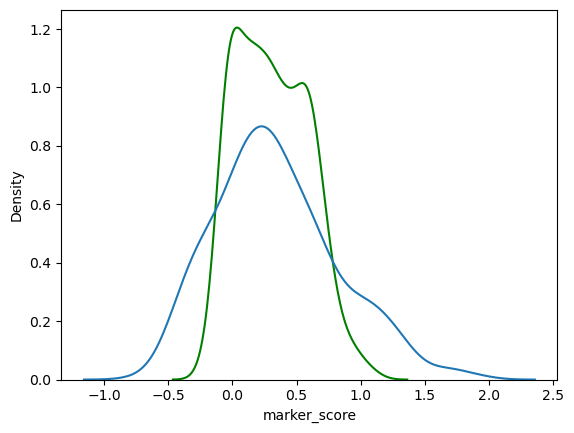

In [50]:
sb.kdeplot(y_pred, color = "g")
sb.kdeplot(y_test)

In [51]:
importances_cb = best_model_cb.feature_importances_
importances_cb = pd.Series(importances_cb, index=prot.columns)
importances_cb=importances_cb.sort_values(ascending=False)

print(importances_cb.head(10))

CD54     8.783593
CD7      4.771105
CD16     4.369735
KLRG1    3.948936
CD24     3.515830
CD163    2.899575
CD226    2.734105
CD196    2.553808
CD69     2.036193
TIGIT    1.729511
dtype: float64


In [52]:
#df from the top 20 important markers
importances_cb=pd.DataFrame(importances_cb)
importances_cb_top=importances_cb[0:20]
importances_cb_top=importances_cb_top.T

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


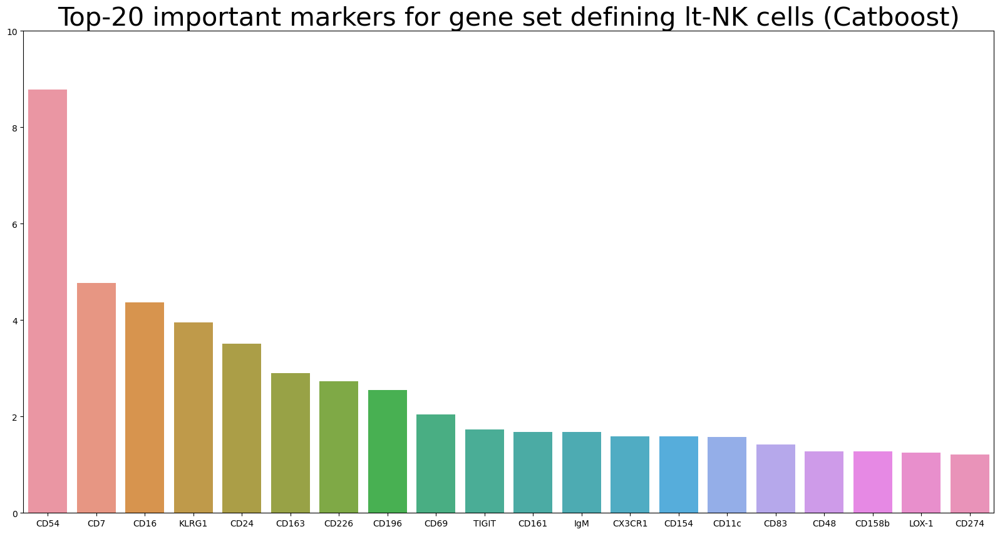

In [59]:
plt.figure(figsize=(20,10))
plt.ylim(0,10)
a=sb.barplot(data=importances_cb_top)

plt.title("Top-20 important markers for gene set defining lt-NK cells (Catboost)", fontsize = 30) ;




## 5. UMAP visualization

In [152]:
markers_prot = ['CD54', 'CD7_prot', 'CD16', 'KLRG1_prot', 'CD24_prot', 'CD163_prot', 'CD226_prot', 'CD196', 'CD69_prot']

In [61]:
#Computing a neighborhood of observations using latent space

sc.pp.neighbors(adata_neurips, use_rep="X_totalVI")   

sc.tl.umap(adata_neurips)

In [139]:
#selecting one sample from Neurips

sample =eg[eg.obs['POOL'] == "s4d1"].copy()


In [140]:
sample

AnnData object with n_obs × n_vars = 4885 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47_prot', 'CD48', 'CD40', 'CD154', 'CD52_prot', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


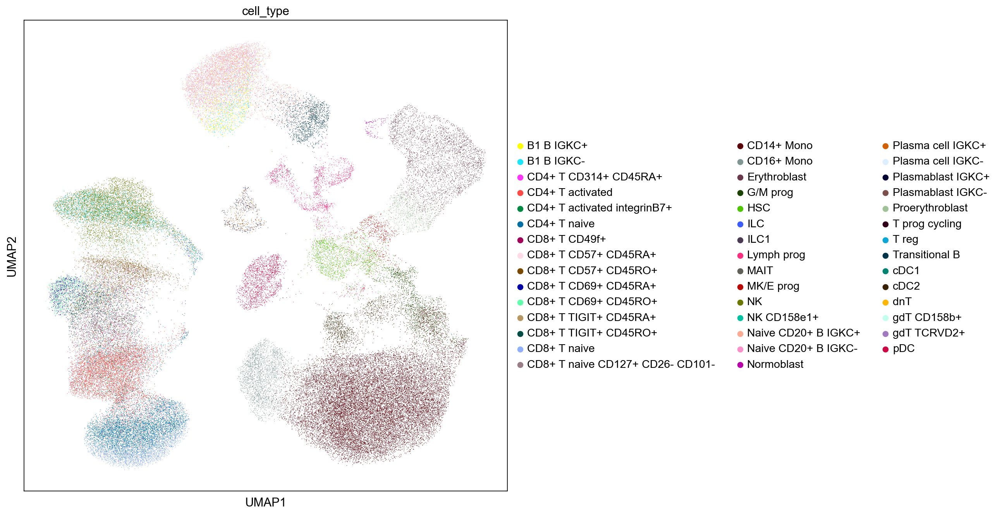

In [64]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips, color = ['cell_type'])

/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


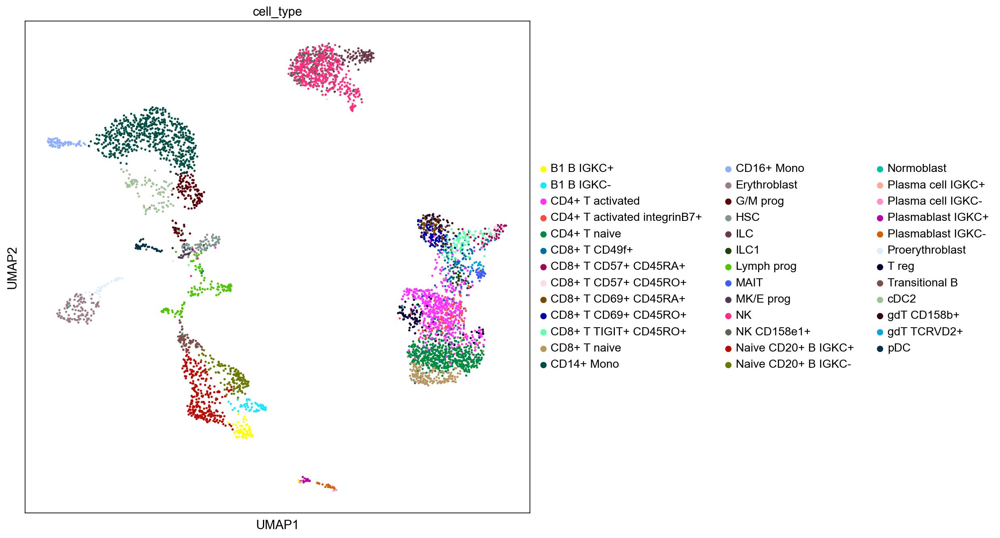

In [65]:
#only one sample

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = ['cell_type'])

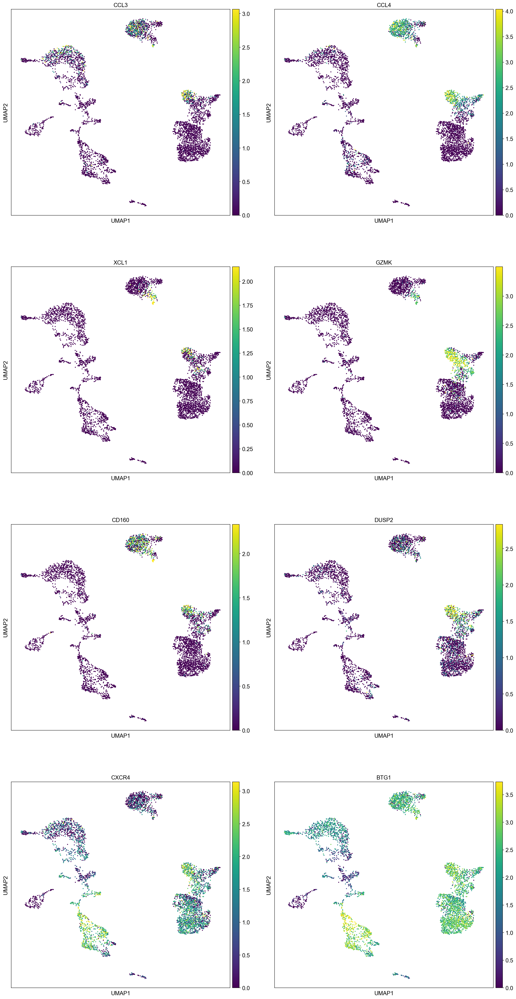

In [66]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = markers,  vmax="p99", ncols = 2)

UMAPs above represent RNA markers for lt-NK cells (according to Melsen et al., paper). 

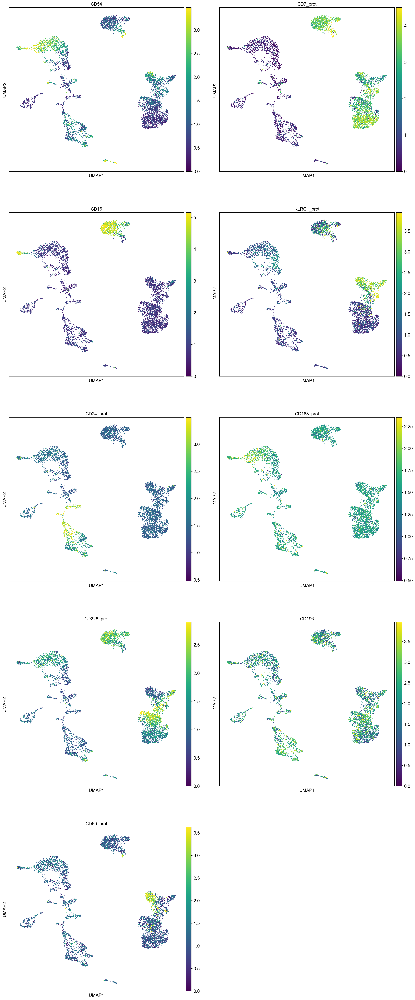

In [153]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(sample, color = markers_prot,  vmax="p99", ncols = 2)

Markers above are important features (surface proteins) identified by CatBoostReggressor. 